# 1. Introduction

Useful links

* https://medium.datadriveninvestor.com/unet-for-semantic-segmentation-implementation-from-scratch-26e043fdcffa
* https://github.com/raoofnaushad/UNET_SALT_DETECTION
* https://keras.io/api/metrics/

## 1.1 Connecting to the drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1.2 Importing the libraries

In [ ]:
!python --version

Python 3.7.15


In [ ]:
import os
import numpy as np
import gc #garbage collector
import random

from tqdm.notebook import tqdm #progress bar

from skimage.transform import resize
import matplotlib.pyplot as plt
from PIL import Image

from sklearn.model_selection import train_test_split, KFold, StratifiedKFold

from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy, Precision, Recall, SensitivityAtSpecificity, SpecificityAtSensitivity, MeanIoU
from tensorflow.keras import Model, backend as K
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, MaxPooling2D, Conv2DTranspose, concatenate, Input, Dropout
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img
from tensorflow.keras.utils import plot_model

## 1.3 Defining global variables

In [ ]:
IM_HEIGHT = 256
IM_WIDTH = 256

# 2. Data preparation

## 2.2 Loading images

In [ ]:
#Loading converted images into arrays
account = 2
if account == 1:
  X = np.load("/content/drive/MyDrive/skin_cancer/assets/numpy_images/x_train.npy") #ISIC2018_Task1_and_2_Training_Input
  y = np.load("/content/drive/MyDrive/skin_cancer/assets/numpy_images/y_train.npy") #ISIC2018_Task1_Training_GroundTruth

  X_valid = np.load("/content/drive/MyDrive/skin_cancer/assets/numpy_images/x_valid.npy") #ISIC2018_Task1_and_2_Validation_Input
  y_valid = np.load("/content/drive/MyDrive/skin_cancer/assets/numpy_images/y_valid.npy") #ISIC2018_Task1_Validation_GroundTruth
else:

  X = np.load("/content/drive/MyDrive/x_train.npy")
  y = np.load("/content/drive/MyDrive/y_train.npy")

  X_valid = np.load("/content/drive/MyDrive/x_valid.npy")
  y_valid = np.load("/content/drive/MyDrive/y_valid.npy")


# X = X[:100]
# y = y[:100]

# X_valid = X_valid[:20]
# y_valid = y_valid[:20]

print(f"No of images in the training - x: {len(X)} y: {len(y)}")
print(f"No of images in the validation - x: {len(X_valid)} y: {len(y_valid)}")

No of images in the training - x: 2594 y: 2594
No of images in the validation - x: 100 y: 100


## 2.2 Plotting image

Random Sample Index is: 2455


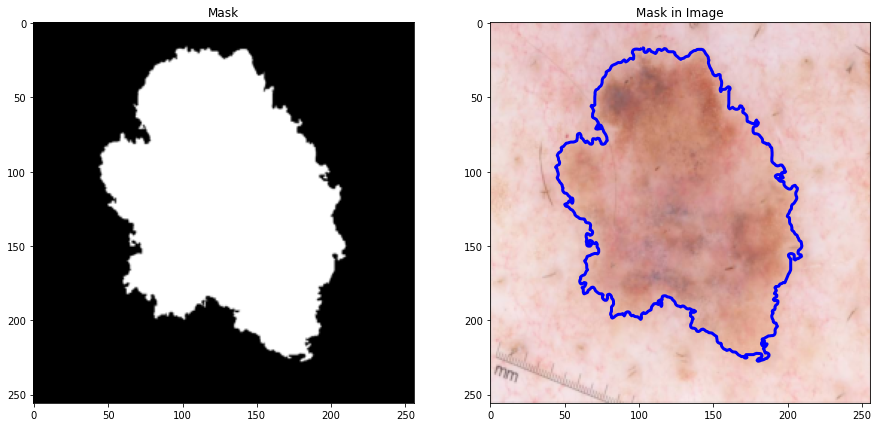

In [ ]:
## Plotting Sample Data

def plot_sample_example():
    ix = random.randint(0, len(X))
    ix = 2455
    print(f"Random Sample Index is: {ix}")
    has_mask = y[ix].max() > 0

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15, 10))

    ax1.imshow(y[ix].squeeze(), cmap = 'gray', interpolation = 'bilinear')
    ax1.set_title('Mask')

    ax2.imshow((X[ix]).squeeze())

    ## If there is a mask
    if has_mask:
        ax2.contour(y[ix].squeeze(), colors = 'blue', linewidths = 3, levels = [0.5])
    ax2.set_title('Mask in Image')
    
plot_sample_example()

# 3. Modeling

## 3.1 defining the model (U-net)

In [ ]:
## 2D two Convolution layer block
def Conv2D_block(input_tensor, n_filters, kernel_size, batchnorm): #Function to add 2 convolutional layers
    #Convolution layer - 1
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer='he_normal', padding='same')(input_tensor)
    #batchnormalization
    if batchnorm:
        x = BatchNormalization()(x)
    #Activation
    x = Activation('relu')(x)
        
    #Convolution layer - 2
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer='he_normal', padding='same')(x)
    #batchnormalization
    if batchnorm:
        x = BatchNormalization()(x)
    #Activation
    x = Activation('relu')(x)
        
    return x

In [ ]:
#Unet Architecture
def unet(input_image, n_filters=16, kernel_size=3, dropout=0.1, batchnorm=False):
    #Encoder Path || Contractor Path
    c1 = Conv2D_block(input_image, n_filters, kernel_size = kernel_size, batchnorm = batchnorm)
    p1 = MaxPooling2D((2,2))(c1)
    # p1 = Dropout(dropout)(p1)
    
    c2 = Conv2D_block(p1, n_filters * 2, kernel_size = kernel_size, batchnorm = batchnorm)
    p2 = MaxPooling2D((2, 2))(c2)
    # p2 = Dropout(dropout)(p2)
    
    c3 = Conv2D_block(p2, n_filters * 4, kernel_size = kernel_size, batchnorm = batchnorm)
    p3 = MaxPooling2D((2, 2))(c3)
    # p3 = Dropout(dropout)(p3)
    
    c4 = Conv2D_block(p3, n_filters * 8, kernel_size = kernel_size, batchnorm = batchnorm)
    p4 = MaxPooling2D((2, 2))(c4)
    # p4 = Dropout(dropout)(p4)
    
    c5 = Conv2D_block(p4, n_filters * 16, kernel_size = kernel_size, batchnorm = batchnorm)

    
    #Decoder Path  || Expansion Path
    u6 = Conv2DTranspose(n_filters * 8, (kernel_size, kernel_size), strides=(2,2), padding='same')(c5)
    u6 = concatenate([u6, c4])
    # u6 = Dropout(dropout)(u6)
    c6 = Conv2D_block(u6, n_filters * 8, kernel_size = kernel_size, batchnorm = batchnorm)

    u7 = Conv2DTranspose(n_filters * 4, (kernel_size, kernel_size), strides=(2,2), padding='same')(c6)
    u7 = concatenate([u7, c3])
    # u7 = Dropout(dropout)(u7)
    c7 = Conv2D_block(u7, n_filters * 4, kernel_size = kernel_size, batchnorm = batchnorm)
    
    u8 = Conv2DTranspose(n_filters * 2, (kernel_size, kernel_size), strides=(2,2), padding='same')(c7)
    u8 = concatenate([u8, c2])
    # u8 = Dropout(dropout)(u8)
    c8 = Conv2D_block(u8, n_filters * 2, kernel_size = kernel_size, batchnorm = batchnorm)
   
    u9 = Conv2DTranspose(n_filters, (kernel_size, kernel_size), strides=(2,2), padding='same')(c8)
    u9 = concatenate([u9, c1])
    # u9 = Dropout(dropout)(u9)
    c9 = Conv2D_block(u9, n_filters, kernel_size = kernel_size, batchnorm = batchnorm)
   
    #final 1*1 Convolutional layer
    output = Conv2D(1, (1,1), activation='sigmoid')(c9)
    model = Model(inputs=[input_image], outputs=[output])
    return model

## 3.1 defining the model (improved U-net)

In [ ]:
## 2D two Convolution layer block
def improved_Conv2D_block(input_tensor, n_filters, conv_number, kernel_size=3, batchnorm=True): #Function to add 2 convolutional layers
    # Convolution layer 
    for conv in range(conv_number):
      x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer='he_normal', padding='same', activation='relu')(input_tensor)
      if batchnorm: x = BatchNormalization()(x)
      input_tensor = x

        
    return x

In [ ]:
#Unet Architecture
def improved_unet(input_image, n_filters=16, kernel_size=3, dropout=0.2, batchnorm=True):
    #Encoder Path || Contractor Path
    c1 = improved_Conv2D_block(input_image, n_filters, kernel_size = kernel_size, batchnorm = batchnorm, conv_number=1)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(dropout)(p1)
    
    c2 = improved_Conv2D_block(p1, (n_filters * 2), kernel_size = kernel_size, batchnorm = batchnorm, conv_number=2)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(dropout)(p2)
    
    c3 = improved_Conv2D_block(p2, (n_filters * 4), kernel_size = kernel_size, batchnorm = batchnorm, conv_number=2)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(dropout)(p3)
    
    c4 = improved_Conv2D_block(p3, (n_filters * 8), kernel_size = kernel_size, batchnorm = batchnorm, conv_number=3)
    
    #Decoder Path  || Expansion Path
    u5 = Conv2DTranspose((n_filters * 4), (kernel_size, kernel_size), strides=(2,2), padding='same')(c4)
    u5 = concatenate([u5, c3])
    u5 = Dropout(dropout)(u5)
    c5 = improved_Conv2D_block(u5, (n_filters * 4), kernel_size = kernel_size, batchnorm = batchnorm, conv_number=2)

    u6 = Conv2DTranspose((n_filters * 2), (kernel_size, kernel_size), strides=(2,2), padding='same')(c5)
    u6 = concatenate([u6, c2])
    u6 = Dropout(dropout)(u6)
    c6 = improved_Conv2D_block(u6, (n_filters * 2), kernel_size = kernel_size, batchnorm = batchnorm, conv_number=2)
    
    u7 = Conv2DTranspose(n_filters, (kernel_size, kernel_size), strides=(2,2), padding='same')(c6)
    u7 = concatenate([u7, c1])
    u7 = Dropout(dropout)(u7)
    
    c7 = improved_Conv2D_block(u7, n_filters, kernel_size = kernel_size, batchnorm = batchnorm, conv_number=1)

    #final 1*1 Convolutional layer
    output = Conv2D(1, (1,1), activation='sigmoid')(c7)
    model = Model(inputs=[input_image], outputs=[output])
    return model

## 3.2 defining the metrics

In [ ]:
def dice_coef(y_true, y_pred, smooth=1):
  y_true_f = K.flatten(y_true)
  y_pred_f = K.flatten(y_pred)
  intersection = K.sum(y_true_f * y_pred_f)
  
  return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
  
def iou(y_true, y_pred): #Jaccard
  y_true_f = K.flatten(y_true)
  y_pred_f = K.flatten(y_pred)

  intersection = K.sum(y_true_f * y_pred_f)
  union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection

  return intersection/union

def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1 - y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())


# 4. Training

In [ ]:
#Instantiate Keras tensor
input_img = Input((IM_HEIGHT, IM_WIDTH, 3), name='img')
metrics=[Accuracy(), Precision(), Recall(), iou, specificity, dice_coef]

#initialize params
n_filters = 32
kernel_size = 5
dropout = 0.1
batch_size = 32
epochs = 25
optimizer = Adam()

#CallBacks
call_backs = [
    EarlyStopping(patience=10, verbose=1), #prevents overfitting or unnecessary training
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1),
    ModelCheckpoint(f'/content/drive/MyDrive/skin_cancer/models/unet/assets/unet13_drop_{n_filters}_{kernel_size}_{batch_size}_{epochs}.h5', verbose=1, save_best_only=True, save_weights_only=True) #saves the model
]

### 3.1.1 Kfold

In [ ]:
#@title Texto de título padrão
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
# kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=7) https://machinelearningmastery.com/evaluate-performance-deep-learning-models-keras/

import time
import gc

kf = KFold(n_splits = 5)

loss_scores = []
precision_scores = []
iou_scores = []
recall_scores = []
specificity_score = []
dice_coef_scores = []

for train_idx, val_idx in list(kf.split(X, y)):
  X_train, X_val = X[train_idx], X[val_idx]
  y_train, y_val = y[train_idx], y[val_idx]

  # create model
  model = unet(input_img, n_filters=n_filters, kernel_size=kernel_size, dropout=dropout, batchnorm=True)
  # Compile model
  model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=metrics)
  # Fit the model
  results = model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, callbacks=call_backs, validation_data=(X_val, y_val))

  loss = (results.history['loss'][-1])
  precision = (results.history['precision'][-1])
  recall = (results.history['recall'][-1])
  iou = (results.history['iou'][-1])
  specificity = (results.history['specificity'][-1])
  dice_coef = (results.history['dice_coef'][-1])

  # loss: 0.2255 - accuracy: 0.0000e+00 - precision: 0.9334 - recall: 0.8127 - iou: 0.5419 - specificity: 0.9705 - dice_coef: 0.7026

  print(f"loss: {loss}")
  print(f"precision: {precision}")
  print(f"recall: {recall}")
  print(f"iou: {iou}")
  print(f"specificity: {specificity}")
  print(f"dice_coef: {dice_coef}")

  loss_scores.append(loss)
  precision_scores.append(precision)
  recall_scores.append(recall)
  iou_scores.append(iou)
  specificity_score.append(specificity)
  dice_coef_scores.append(dice_coef)

  K.clear_session()
  gc.collect()

  del model
  del X_train
  del X_val
  del y_train
  del y_val
  del results
  del train_idx
  del val_idx

print(f"{np.mean(loss_scores)} (+/- {np.std(loss_scores)})")
print(f"{np.mean(precision_scores)} (+/- {np.std(precision_scores)})")
print(f"{np.mean(recall_scores)} (+/- {np.std(recall_scores)})")
print(f"{np.mean(iou_scores)} (+/- {np.std(iou_scores)})")
print(f"{np.mean(specificity_score)} (+/- {np.std(specificity_score)})")
print(f"{np.mean(dice_coef_scores)} (+/- {np.std(dice_coef_scores)})")

Epoch 1/25
65/65 [==============================] - ETA: 0s - loss: 0.3565 - accuracy: 0.0000e+00 - precision: 0.7827 - recall: 0.6185 - iou: 0.3424 - specificity: 0.9416 - dice_coef: 0.5076
Epoch 1: val_loss improved from inf to 257.95181, saving model to /content/drive/MyDrive/skin_cancer/models/unet/assets/unet6_32_5_32_25.h5
65/65 [==============================] - 113s 1s/step - loss: 0.3565 - accuracy: 0.0000e+00 - precision: 0.7827 - recall: 0.6185 - iou: 0.3424 - specificity: 0.9416 - dice_coef: 0.5076 - val_loss: 257.9518 - val_accuracy: 0.0000e+00 - val_precision: 0.1404 - val_recall: 0.9995 - val_iou: 0.1263 - val_specificity: 0.0087 - val_dice_coef: 0.2202 - lr: 0.0010
Epoch 2/25
65/65 [==============================] - ETA: 0s - loss: 0.2943 - accuracy: 2.2061e-08 - precision: 0.8610 - recall: 0.6666 - iou: 0.4016 - specificity: 0.9623 - dice_coef: 0.5720
Epoch 2: val_loss improved from 257.95181 to 0.58279, saving model to /content/drive/MyDrive/skin_cancer/models/unet/as

### 3.1.2 train_test_split

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2)

from datetime import datetime
start=datetime.now()

# create model
model = unet(input_img, n_filters=n_filters, kernel_size=kernel_size, dropout=dropout)
# Compile model
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=metrics)
# Fit the model
results = model.fit(X_train, y_train, batch_size=batch_size, epochs=epochs, callbacks=call_backs, validation_data=(X_val, y_val))

K.clear_session()
gc.collect()

print(f"time: {datetime.now()-start}")

Epoch 1/25
65/65 [==============================] - ETA: 0s - loss: 0.6093 - accuracy: 1.0856e-04 - precision: 0.6719 - recall: 0.2192 - iou: 0.1945 - specificity: 0.9668 - dice_coef: 0.3217
Epoch 1: val_loss improved from inf to 0.37023, saving model to /content/drive/MyDrive/skin_cancer/models/unet/assets/unet13_drop_32_5_32_25.h5
65/65 [==============================] - 76s 1s/step - loss: 0.6093 - accuracy: 1.0856e-04 - precision: 0.6719 - recall: 0.2192 - iou: 0.1945 - specificity: 0.9668 - dice_coef: 0.3217 - val_loss: 0.3702 - val_accuracy: 0.0000e+00 - val_precision: 0.8647 - val_recall: 0.2463 - val_iou: 0.2110 - val_specificity: 0.9881 - val_dice_coef: 0.3479 - lr: 0.0010
Epoch 2/25
65/65 [==============================] - ETA: 0s - loss: 0.4023 - accuracy: 0.0000e+00 - precision: 0.7720 - recall: 0.3341 - iou: 0.2326 - specificity: 0.9704 - dice_coef: 0.3746
Epoch 2: val_loss did not improve from 0.37023
65/65 [==============================] - 63s 969ms/step - loss: 0.4023 

In [ ]:
K.clear_session()
gc.collect()

96

# 5. Results

## 5.1 U-net

[0.15979282557964325, 0.2191777378320694, 0.2500113844871521, 0.3572121858596802, 0.40100955963134766, 0.44845134019851685, 0.46273696422576904, 0.4845624566078186, 0.5016963481903076, 0.5018887519836426, 0.4994138777256012, 0.5143794417381287, 0.5106484889984131, 0.5317859649658203, 0.5320945382118225, 0.5245189666748047, 0.5390027761459351, 0.5404037237167358, 0.5379688143730164, 0.5388622283935547, 0.5203741192817688, 0.5384706854820251, 0.5562198162078857, 0.5576924085617065, 0.5658313632011414]


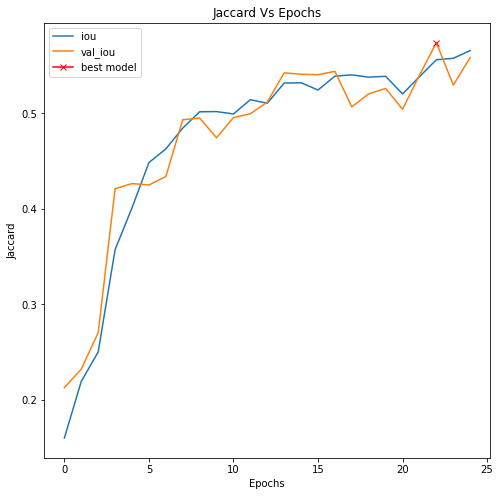

In [ ]:
#Unet Jaccard
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Jaccard Vs Epochs")
    plt.plot(results.history["iou"], label="iou")
    plt.plot(results.history["val_iou"], label="val_iou")
    plt.plot( np.argmax(results.history["val_iou"]), np.max(results.history["val_iou"]), marker="x", color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("Jaccard")
    plt.legend()

    
plot_history(results)
print(results.history["iou"])

[0.6880761981010437, 0.3655971884727478, 0.34583374857902527, 0.29928839206695557, 0.27177274227142334, 0.24206195771694183, 0.23161768913269043, 0.2192387729883194, 0.21049194037914276, 0.21126307547092438, 0.2102884203195572, 0.20269536972045898, 0.2044806331396103, 0.18901023268699646, 0.19004684686660767, 0.19450902938842773, 0.186977356672287, 0.18488489091396332, 0.18681983649730682, 0.19013483822345734, 0.19804732501506805, 0.18625611066818237, 0.17665739357471466, 0.17650866508483887, 0.17171695828437805]


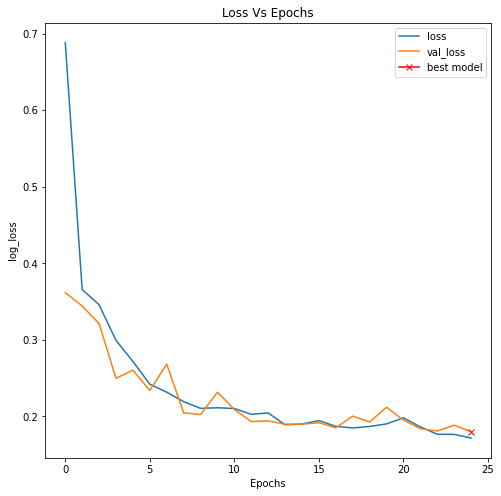

In [ ]:
#Unet loss
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Loss Vs Epochs")
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("log_loss")
    plt.legend()

    
plot_history(results)
print(results.history["loss"])

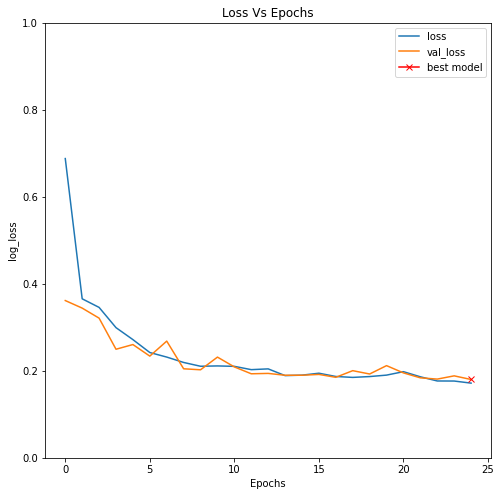

In [ ]:
#Unet loss
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Loss Vs Epochs")
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("log_loss")
    plt.legend()

    
plot_history(results)

[0.24231009185314178, 0.9183598756790161, 0.8750324845314026, 0.8686561584472656, 0.8872184157371521, 0.900895357131958, 0.8966434001922607, 0.9093619585037231, 0.9108468890190125, 0.914886474609375, 0.9141030311584473, 0.9156718850135803, 0.9083536863327026, 0.9218881726264954, 0.9224098920822144, 0.9143906831741333, 0.9241209626197815, 0.9255846738815308, 0.9280865788459778, 0.9230050444602966, 0.91989666223526, 0.9230843782424927, 0.9298556447029114, 0.9292639493942261, 0.933059573173523]


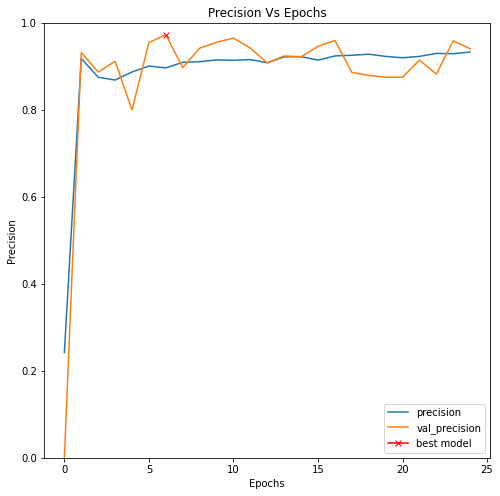

In [ ]:
#Unet Precision
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Precision Vs Epochs")
    plt.plot(results.history["precision"], label="precision")
    plt.plot(results.history["val_precision"], label="val_precision")
    plt.plot(np.argmax(results.history["val_precision"]), np.max(results.history["val_precision"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Precision")
    plt.legend()

plot_history(results)
print(results.history["precision"])

[0.9517164826393127, 0.9976588487625122, 0.9843153357505798, 0.973093569278717, 0.9735105037689209, 0.9747390151023865, 0.9727226495742798, 0.9753569960594177, 0.9746120572090149, 0.975740373134613, 0.9755147099494934, 0.9753443598747253, 0.9732446074485779, 0.9761886596679688, 0.9764193892478943, 0.9742577075958252, 0.9767233729362488, 0.9774066805839539, 0.9778700470924377, 0.9763802289962769, 0.9761499166488647, 0.976668119430542, 0.977691650390625, 0.9776914119720459, 0.9782218337059021]


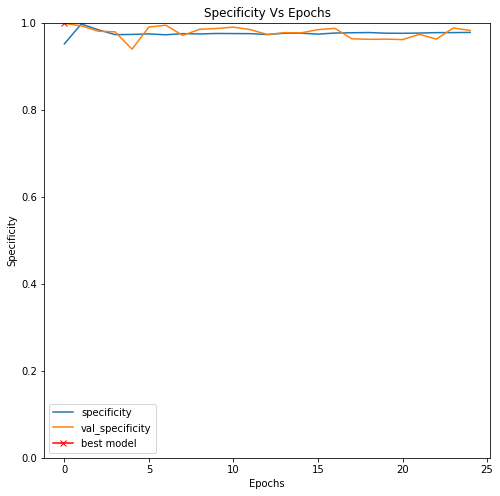

In [ ]:
# Unet Specificity
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Specificity Vs Epochs")
    plt.plot(results.history["specificity"], label="specificity")
    plt.plot(results.history["val_specificity"], label="val_specificity")
    plt.plot(np.argmax(results.history["val_specificity"]), np.max(results.history["val_specificity"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Specificity")
    plt.legend()

plot_history(results)
print(results.history["specificity"])

[0.27302324771881104, 0.35911524295806885, 0.3991219699382782, 0.5230495929718018, 0.5703034996986389, 0.6178289651870728, 0.631652295589447, 0.6518975496292114, 0.667361855506897, 0.667113721370697, 0.6649099588394165, 0.6784715056419373, 0.6748114824295044, 0.693751871585846, 0.6937457323074341, 0.6869049668312073, 0.6995816826820374, 0.7010171413421631, 0.6988670229911804, 0.6987667679786682, 0.683781087398529, 0.699328601360321, 0.7142572999000549, 0.7153056859970093, 0.7221267223358154]


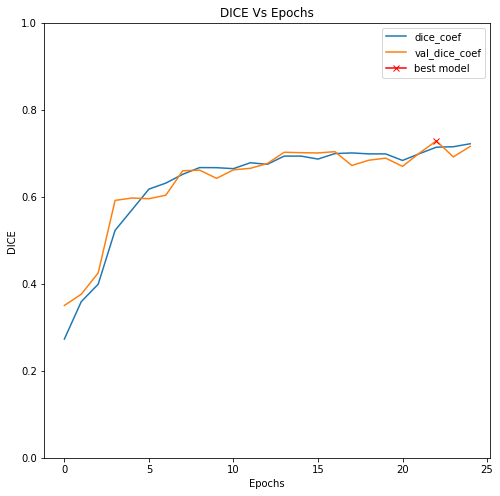

In [ ]:
#Unet DICE
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("DICE Vs Epochs")
    plt.plot(results.history["dice_coef"], label="dice_coef")
    plt.plot(results.history["val_dice_coef"], label="val_dice_coef")
    plt.plot(np.argmax(results.history["val_dice_coef"]), np.max(results.history["val_dice_coef"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("DICE")
    plt.legend()

plot_history(results)
print(results.history["dice_coef"])

[0.053926095366477966, 0.017222275957465172, 0.32651615142822266, 0.5564215779304504, 0.6263991594314575, 0.6795192360877991, 0.707146167755127, 0.7223835587501526, 0.7495579719543457, 0.7459344267845154, 0.7479555010795593, 0.7611665725708008, 0.7589616775512695, 0.7777727842330933, 0.7745852470397949, 0.7768506407737732, 0.7820315361022949, 0.7820732593536377, 0.7794240713119507, 0.7811287641525269, 0.7626539468765259, 0.7803831100463867, 0.8018063306808472, 0.8029891848564148, 0.8129287958145142]


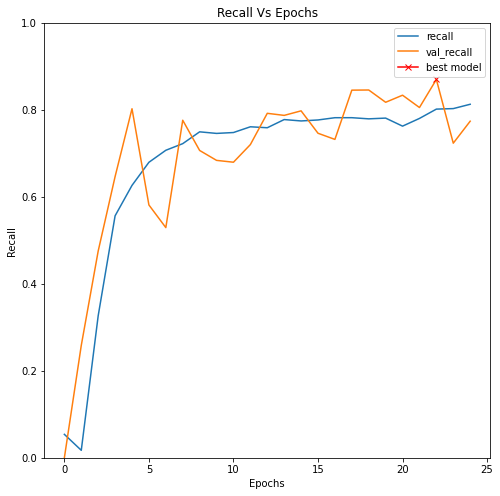

In [ ]:
#Unet Recall
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Recall Vs Epochs")
    plt.plot(results.history["recall"], label="recall")
    plt.plot(results.history["val_recall"], label="val_recall")
    plt.plot(np.argmax(results.history["val_recall"]), np.max(results.history["val_recall"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Recall")
    plt.legend()

plot_history(results)
print(results.history["recall"])

In [ ]:
model.evaluate(X_valid, y_valid, verbose=1)

4/4 [==============================] - 3s 767ms/step - loss: 0.2331 - accuracy: 0.0000e+00 - precision: 0.9442 - recall: 0.8171 - iou: 0.5575 - specificity: 0.9767 - dice_coef: 0.7148


[0.23305314779281616,
 0.0,
 0.9441792964935303,
 0.8170947432518005,
 0.5575317144393921,
 0.9766565561294556,
 0.7148069143295288]

In [ ]:
np.sum([np.prod(v.get_shape().as_list()) for v in model.trainable_variables])

23967457

In [ ]:
preds_val = model.predict(X_valid, verbose=1)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

4/4 [==============================] - 1s 318ms/step


In [ ]:
def plot_sample_results(X, y, preds, binary_preds, has_mask):
    ix = random.randint(0, len(X))
    print(ix)
    
    fig, ax = plt.subplots(1, 4, figsize=(20,10))
    
    ax[0].imshow(X[ix])
    if has_mask:
        ax[0].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[0].set_title('real mask')
    
    ax[1].imshow(preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[1].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[1].set_title('cancer Predicted')
    
    ax[2].imshow(binary_preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[2].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[2].set_title('cancer Predicted Binary')

    ax[3].imshow(X[ix])
    if has_mask:
        ax[3].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[3].contour(binary_preds[ix].squeeze(), colors='y', levels=[0.5])
    ax[3].set_title('cancer')

62


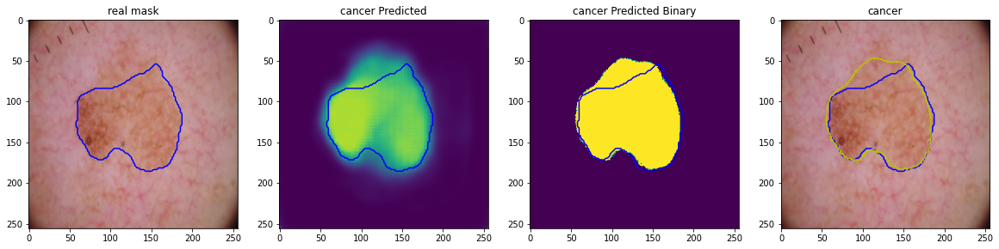

In [ ]:
## Predictions on Test Set 62
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

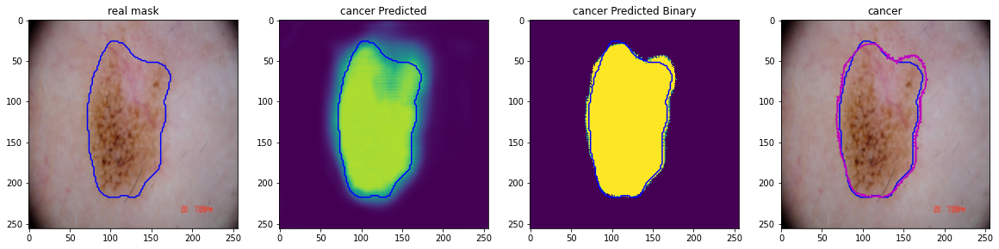

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

58


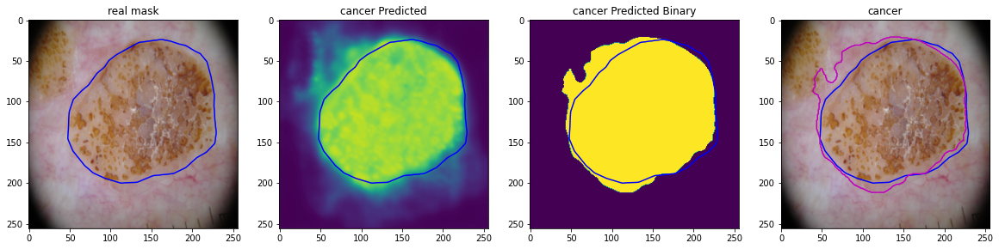

In [ ]:
## Predictions on Test Set 40
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

57


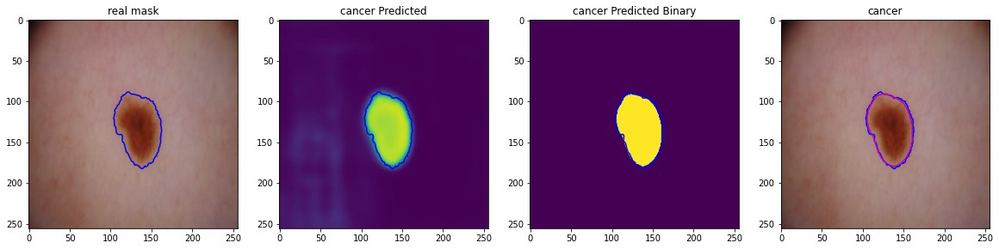

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

15


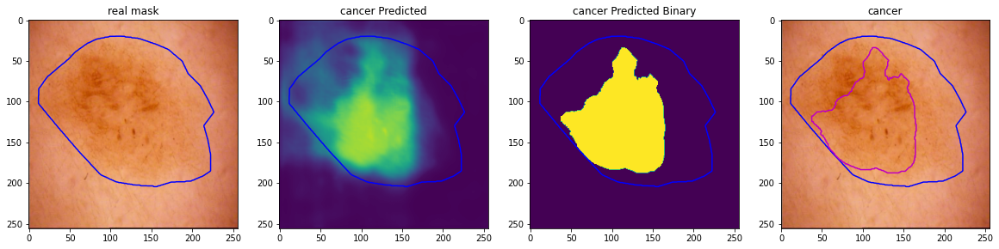

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

44


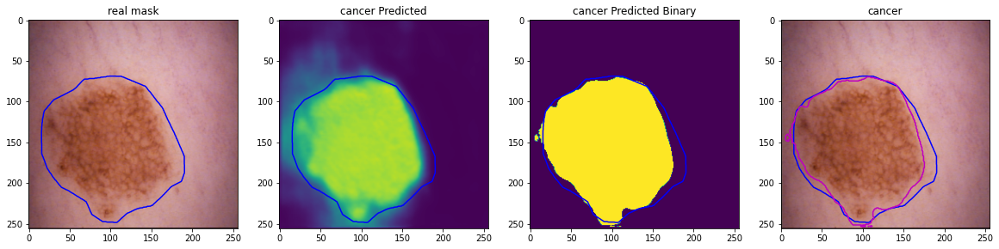

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True) #44

4


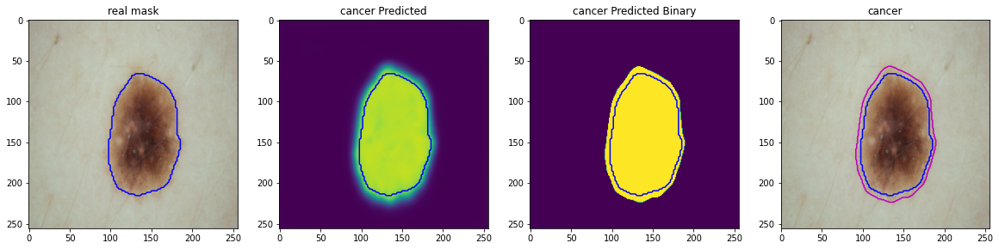

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

50


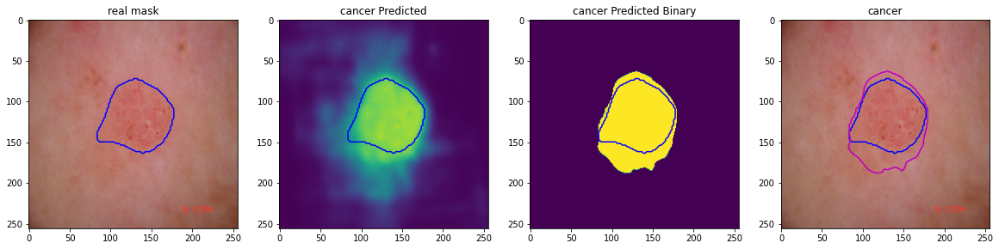

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

95


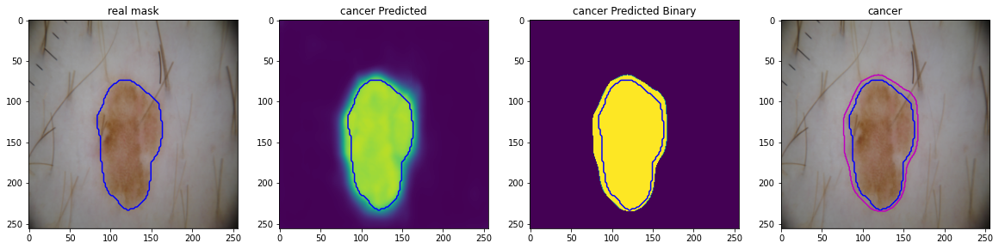

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

8


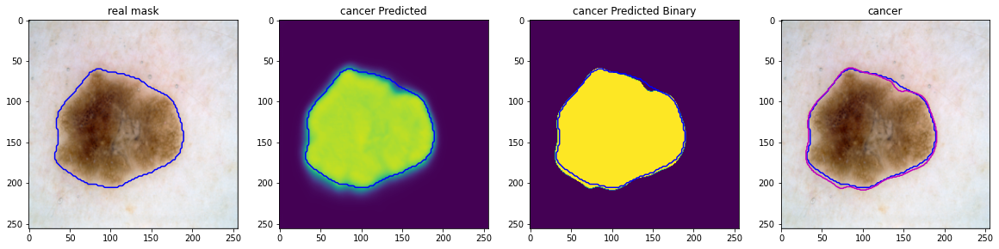

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

33


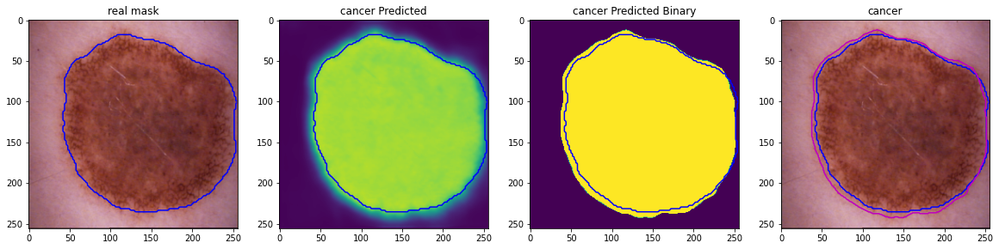

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

79


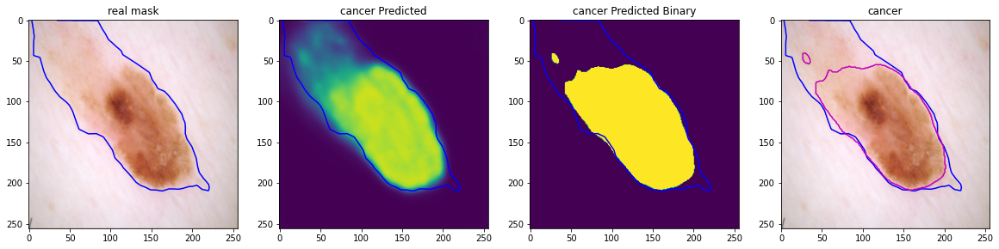

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

## 5.1 U-net 2

[0.19449706375598907, 0.23264078795909882, 0.22754020988941193, 0.2486777901649475, 0.25786957144737244, 0.25946706533432007, 0.2733367085456848, 0.27605414390563965, 0.2848389148712158, 0.2941823899745941, 0.29349416494369507, 0.29679587483406067, 0.2988753318786621, 0.29491448402404785, 0.29442474246025085, 0.29571375250816345, 0.30251115560531616, 0.3093562722206116, 0.31172946095466614, 0.3138124644756317, 0.31466007232666016, 0.3152015805244446, 0.3177778124809265, 0.31727492809295654, 0.31614208221435547]


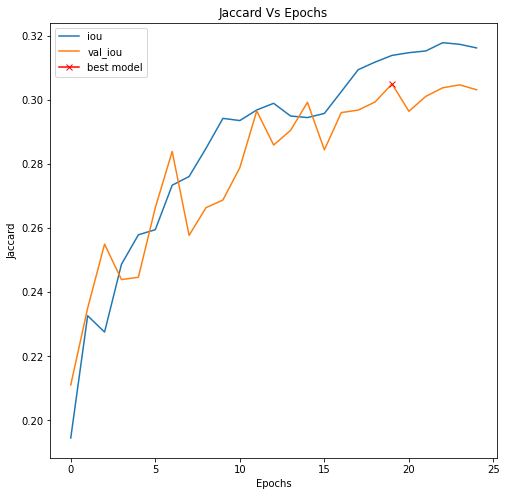

In [ ]:
#Unet Jaccard
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Jaccard Vs Epochs")
    plt.plot(results.history["iou"], label="iou")
    plt.plot(results.history["val_iou"], label="val_iou")
    plt.plot( np.argmax(results.history["val_iou"]), np.max(results.history["val_iou"]), marker="x", color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("Jaccard")
    plt.legend()

    
plot_history(results)
print(results.history["iou"])

[0.6092746257781982, 0.4023011326789856, 0.44846218824386597, 0.3636736273765564, 0.3576725721359253, 0.3563547432422638, 0.34906360507011414, 0.34751826524734497, 0.3447285294532776, 0.33885517716407776, 0.33842042088508606, 0.3385849893093109, 0.33668744564056396, 0.3401927649974823, 0.3379051983356476, 0.340835303068161, 0.3348367512226105, 0.329242467880249, 0.32698652148246765, 0.3260077238082886, 0.32618024945259094, 0.325453519821167, 0.3250464200973511, 0.32510942220687866, 0.3241906762123108]


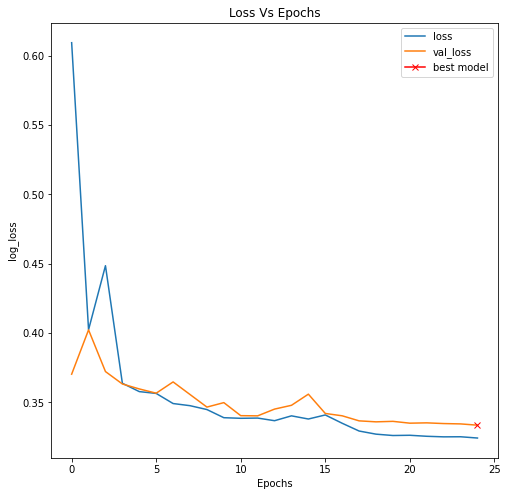

In [ ]:
#Unet loss
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Loss Vs Epochs")
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("log_loss")
    plt.legend()

    
plot_history(results)
print(results.history["loss"])

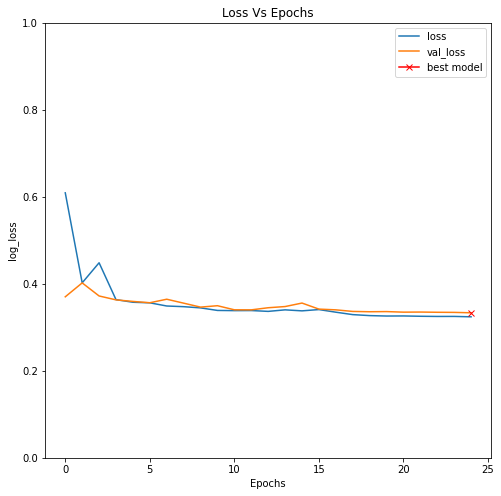

In [ ]:
#Unet loss
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Loss Vs Epochs")
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot( np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("log_loss")
    plt.legend()

    
plot_history(results)

[0.6719064712524414, 0.7719614505767822, 0.6680848002433777, 0.7797794938087463, 0.7866148948669434, 0.8126700520515442, 0.828554093837738, 0.8372873067855835, 0.8354741334915161, 0.8394883275032043, 0.8433468341827393, 0.8425623178482056, 0.8524795174598694, 0.8327144384384155, 0.8480826020240784, 0.8417399525642395, 0.8479013442993164, 0.8477723002433777, 0.8532533645629883, 0.853543758392334, 0.8455739617347717, 0.8487800359725952, 0.8451430797576904, 0.8471841812133789, 0.8465996384620667]


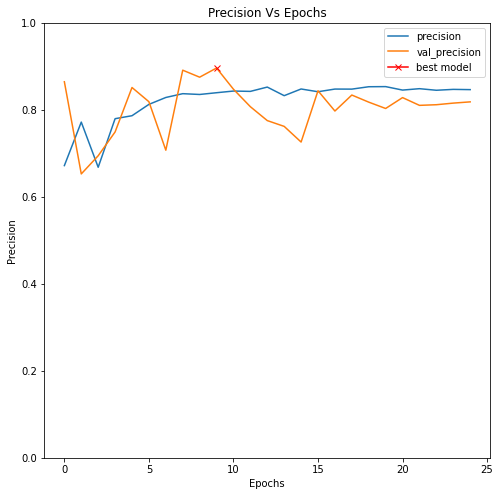

In [ ]:
#Unet Precision
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Precision Vs Epochs")
    plt.plot(results.history["precision"], label="precision")
    plt.plot(results.history["val_precision"], label="val_precision")
    plt.plot(np.argmax(results.history["val_precision"]), np.max(results.history["val_precision"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Precision")
    plt.legend()

plot_history(results)
print(results.history["precision"])

[0.966810941696167, 0.9703730940818787, 0.9478136897087097, 0.9681040644645691, 0.966549277305603, 0.9734848737716675, 0.9739583134651184, 0.9753316044807434, 0.9736910462379456, 0.9737241864204407, 0.9745251536369324, 0.9742629528045654, 0.976308286190033, 0.9731200337409973, 0.9758087396621704, 0.974755585193634, 0.9749519228935242, 0.9737339615821838, 0.9746736884117126, 0.9746782779693604, 0.97266685962677, 0.9735486507415771, 0.9723337292671204, 0.9729740619659424, 0.9726511836051941]


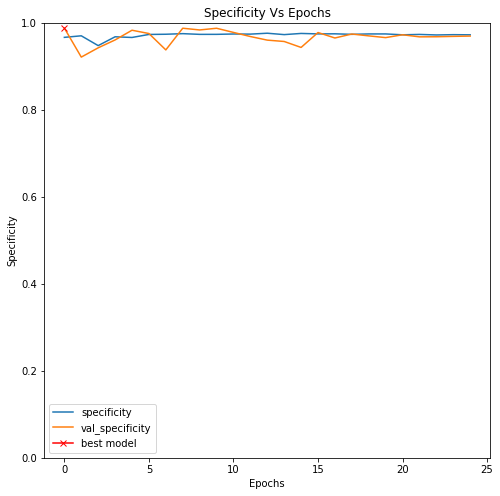

In [ ]:
# Unet Specificity
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Specificity Vs Epochs")
    plt.plot(results.history["specificity"], label="specificity")
    plt.plot(results.history["val_specificity"], label="val_specificity")
    plt.plot(np.argmax(results.history["val_specificity"]), np.max(results.history["val_specificity"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Specificity")
    plt.legend()

plot_history(results)
print(results.history["specificity"])

[0.3217429220676422, 0.37457185983657837, 0.36904585361480713, 0.39705172181129456, 0.40907520055770874, 0.4108773469924927, 0.42759522795677185, 0.4315144419670105, 0.44202858209609985, 0.453492671251297, 0.45250117778778076, 0.45662006735801697, 0.45834606885910034, 0.4536646008491516, 0.45377084612846375, 0.45500487089157104, 0.4629415273666382, 0.4713742434978485, 0.47458165884017944, 0.47652190923690796, 0.4774252772331238, 0.478055864572525, 0.48093268275260925, 0.48046359419822693, 0.47895994782447815]


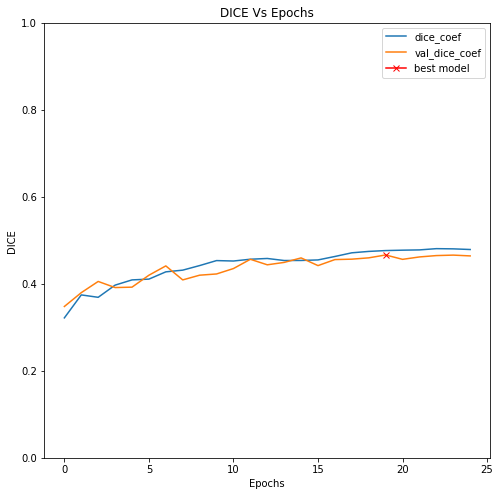

In [ ]:
#Unet DICE
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("DICE Vs Epochs")
    plt.plot(results.history["dice_coef"], label="dice_coef")
    plt.plot(results.history["val_dice_coef"], label="val_dice_coef")
    plt.plot(np.argmax(results.history["val_dice_coef"]), np.max(results.history["val_dice_coef"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("DICE")
    plt.legend()

plot_history(results)
print(results.history["dice_coef"])

[0.21918043494224548, 0.334148645401001, 0.35589149594306946, 0.37872061133384705, 0.40805742144584656, 0.37564265727996826, 0.4099039137363434, 0.41371950507164, 0.4346523582935333, 0.44837599992752075, 0.44460856914520264, 0.4441450834274292, 0.4411778151988983, 0.4337210953235626, 0.4362688958644867, 0.43706104159355164, 0.45255500078201294, 0.4705541431903839, 0.471229612827301, 0.4738864302635193, 0.48170116543769836, 0.4795702397823334, 0.4856690764427185, 0.4833846688270569, 0.48554831743240356]


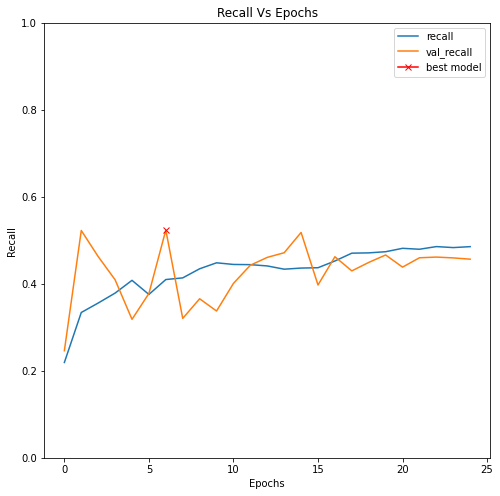

In [ ]:
#Unet Recall
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Recall Vs Epochs")
    plt.plot(results.history["recall"], label="recall")
    plt.plot(results.history["val_recall"], label="val_recall")
    plt.plot(np.argmax(results.history["val_recall"]), np.max(results.history["val_recall"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Recall")
    plt.legend()

plot_history(results)
print(results.history["recall"])

In [ ]:
model.evaluate(X_valid, y_valid, verbose=1)

4/4 [==============================] - 3s 678ms/step - loss: 0.3903 - accuracy: 0.0000e+00 - precision: 0.7925 - recall: 0.5855 - iou: 0.3303 - specificity: 0.9223 - dice_coef: 0.4934


[0.39030060172080994,
 0.0,
 0.7925145030021667,
 0.5855250358581543,
 0.3303382396697998,
 0.9222608804702759,
 0.4934179484844208]

In [ ]:
np.sum([np.prod(v.get_shape().as_list()) for v in model.trainable_variables])

23967457

In [ ]:
preds_val = model.predict(X_valid, verbose=1)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

4/4 [==============================] - 1s 293ms/step


In [ ]:
def plot_sample_results(X, y, preds, binary_preds, has_mask):
    ix = random.randint(0, len(X))
    print(ix)
    
    fig, ax = plt.subplots(1, 4, figsize=(20,10))
    
    ax[0].imshow(X[ix])
    if has_mask:
        ax[0].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[0].set_title('real mask')
    
    ax[1].imshow(preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[1].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[1].set_title('cancer Predicted')
    
    ax[2].imshow(binary_preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[2].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[2].set_title('cancer Predicted Binary')

    ax[3].imshow(X[ix])
    if has_mask:
        ax[3].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[3].contour(binary_preds[ix].squeeze(), colors='y', levels=[0.5])
    ax[3].set_title('cancer')

79


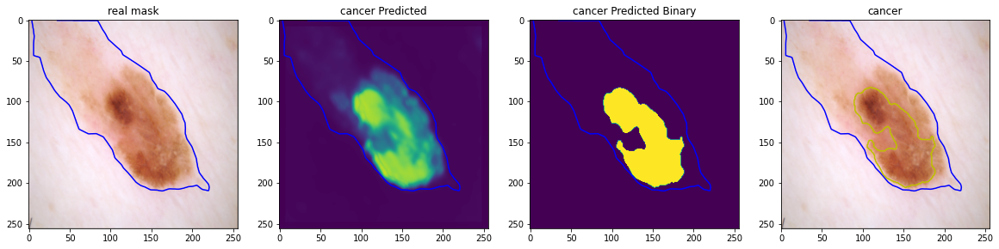

In [ ]:
## Predictions on Test Set 62
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

57


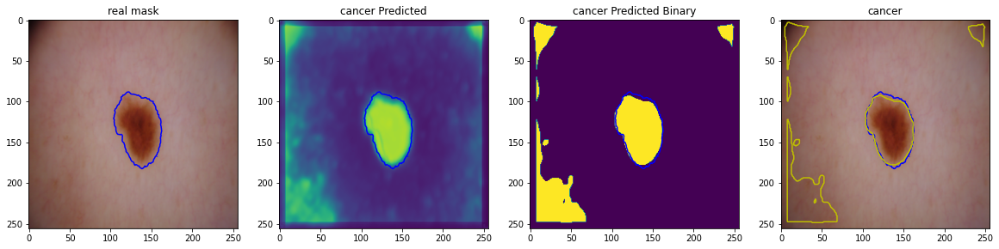

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

In [ ]:
## Predictions on Test Set 40
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

6


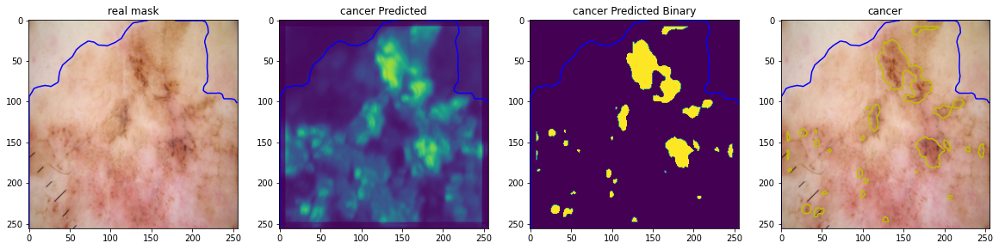

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True) #44

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

## 5.1 Improved U-net

[0.2718053460121155, 0.3517286777496338, 0.40464651584625244, 0.45148569345474243, 0.4748653769493103, 0.4934360086917877, 0.5120075941085815, 0.5140537619590759, 0.5177229642868042, 0.5263283848762512, 0.5201886296272278, 0.534117579460144, 0.547117292881012, 0.5475339889526367, 0.5653462409973145, 0.5740624666213989, 0.5771271586418152, 0.5703347325325012, 0.5778309106826782, 0.5829443335533142, 0.5827752947807312, 0.582873523235321, 0.5840110778808594, 0.5822188258171082, 0.5870672464370728]


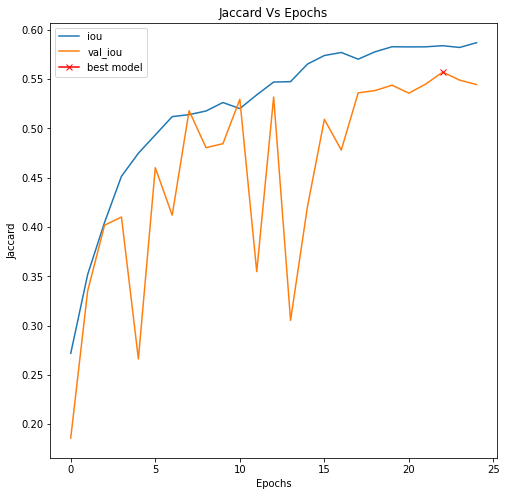

In [ ]:
#Improved Unet Jaccard
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Jaccard Vs Epochs")
    plt.plot(results.history["iou"], label="iou")
    plt.plot(results.history["val_iou"], label="val_iou")
    plt.plot( np.argmax(results.history["val_iou"]), np.max(results.history["val_iou"]), marker="x", color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("Jaccard")
    plt.legend()

    
plot_history(results)
print(results.history["iou"])

[0.5119901299476624, 0.371644526720047, 0.2893305718898773, 0.24203474819660187, 0.22353146970272064, 0.21121062338352203, 0.20126906037330627, 0.19936484098434448, 0.19858402013778687, 0.19133658707141876, 0.19641143083572388, 0.19121089577674866, 0.18086335062980652, 0.182125985622406, 0.17058895528316498, 0.1680920124053955, 0.16701282560825348, 0.16779613494873047, 0.16624879837036133, 0.16314375400543213, 0.16458839178085327, 0.1632888913154602, 0.1634746789932251, 0.16311423480510712, 0.16227464377880096]


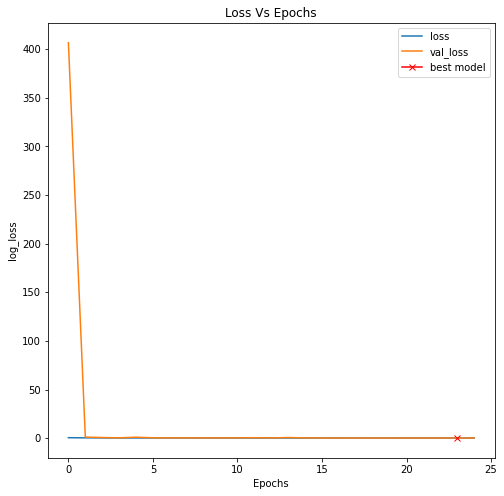

In [ ]:
#Improved Unet Jaccard
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Loss Vs Epochs")
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot(np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("log_loss")
    plt.legend()

plot_history(results)
print(results.history["loss"])

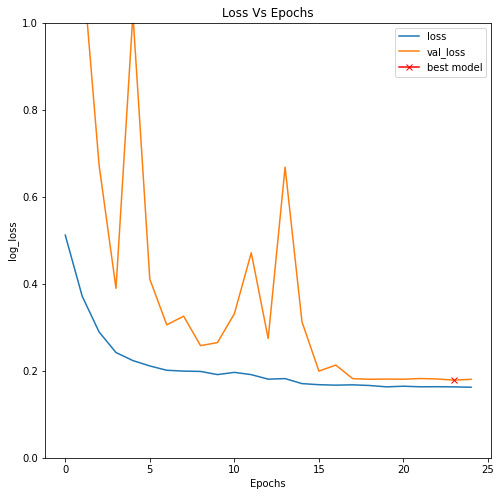

In [ ]:
#Improved Unet Jaccard
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Loss Vs Epochs")
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot(np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("log_loss")
    plt.legend()

plot_history(results)

[0.6762531995773315, 0.8191287517547607, 0.8666986227035522, 0.8870836496353149, 0.8985061645507812, 0.9076418876647949, 0.9123138785362244, 0.9106996655464172, 0.9085614681243896, 0.9188327789306641, 0.9126534461975098, 0.9165872931480408, 0.9248635768890381, 0.9252033829689026, 0.9304619431495667, 0.9320724606513977, 0.9414811134338379, 0.9355431795120239, 0.9411422610282898, 0.941717803478241, 0.9397104978561401, 0.9389703273773193, 0.9400876760482788, 0.9431299567222595, 0.9427415132522583]


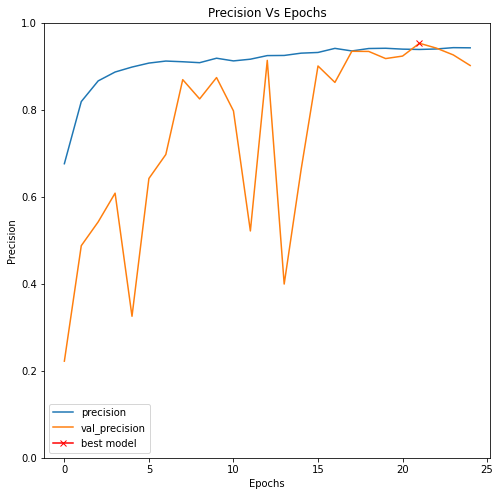

In [ ]:
#Improved Unet Precision
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Precision Vs Epochs")
    plt.plot(results.history["precision"], label="precision")
    plt.plot(results.history["val_precision"], label="val_precision")
    plt.plot(np.argmax(results.history["val_precision"]), np.max(results.history["val_precision"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Precision")
    plt.legend()

plot_history(results)
print(results.history["precision"])

[0.9200092554092407, 0.9524310231208801, 0.9638147950172424, 0.9682030081748962, 0.9715226292610168, 0.973443329334259, 0.9739284515380859, 0.9735462069511414, 0.9731469750404358, 0.9759458899497986, 0.9743623733520508, 0.9749999046325684, 0.9767932891845703, 0.9770869016647339, 0.9774571657180786, 0.9777607917785645, 0.9806914329528809, 0.9792410731315613, 0.9806622862815857, 0.980354905128479, 0.9799937605857849, 0.9796419739723206, 0.9801225066184998, 0.9810308814048767, 0.980603039264679]


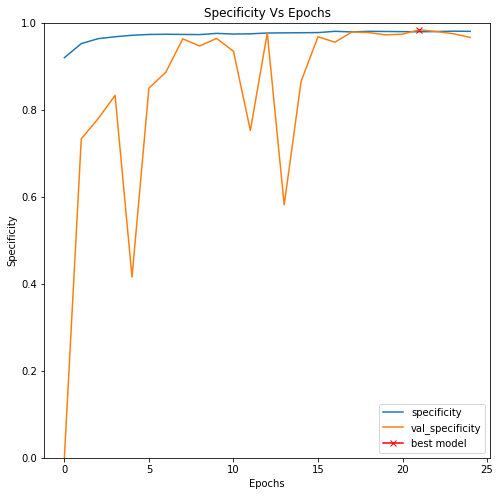

In [ ]:
#Improved Unet Specificity
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Specificity Vs Epochs")
    plt.plot(results.history["specificity"], label="specificity")
    plt.plot(results.history["val_specificity"], label="val_specificity")
    plt.plot(np.argmax(results.history["val_specificity"]), np.max(results.history["val_specificity"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Specificity")
    plt.legend()

plot_history(results)
print(results.history["specificity"])

[0.42581796646118164, 0.5193747878074646, 0.5750431418418884, 0.6213805079460144, 0.6433683633804321, 0.6602283716201782, 0.6768083572387695, 0.6784602999687195, 0.68183434009552, 0.6892292499542236, 0.6839179992675781, 0.6959506869316101, 0.7068694233894348, 0.7072214484214783, 0.7219982147216797, 0.7291574478149414, 0.7315828204154968, 0.7259860038757324, 0.7321993708610535, 0.7362728118896484, 0.7360227704048157, 0.7362304925918579, 0.7371135950088501, 0.7356566786766052, 0.739503800868988]


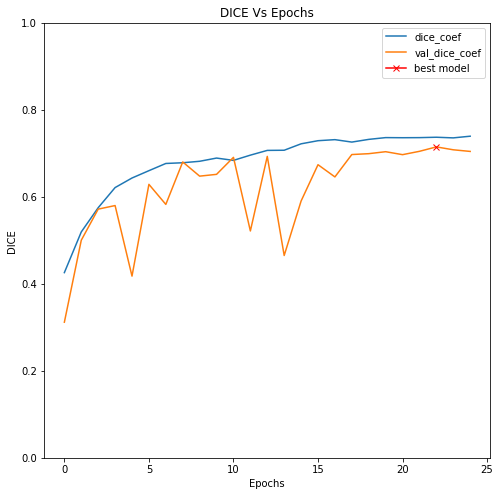

In [ ]:
#Improved Unet DICE
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("DICE Vs Epochs")
    plt.plot(results.history["dice_coef"], label="dice_coef")
    plt.plot(results.history["val_dice_coef"], label="val_dice_coef")
    plt.plot(np.argmax(results.history["val_dice_coef"]), np.max(results.history["val_dice_coef"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("DICE")
    plt.legend()

plot_history(results)
print(results.history["dice_coef"])

[0.5701190233230591, 0.6823538541793823, 0.7227417230606079, 0.7511677145957947, 0.7474148273468018, 0.7609733939170837, 0.7767066359519958, 0.7786636352539062, 0.7851497530937195, 0.7830573916435242, 0.7767075896263123, 0.7919446229934692, 0.8039273023605347, 0.798801064491272, 0.8301903009414673, 0.8342104554176331, 0.8241381049156189, 0.8263181447982788, 0.8242112398147583, 0.8352110385894775, 0.832979679107666, 0.8379653096199036, 0.8327717781066895, 0.8322416543960571, 0.8370408415794373]


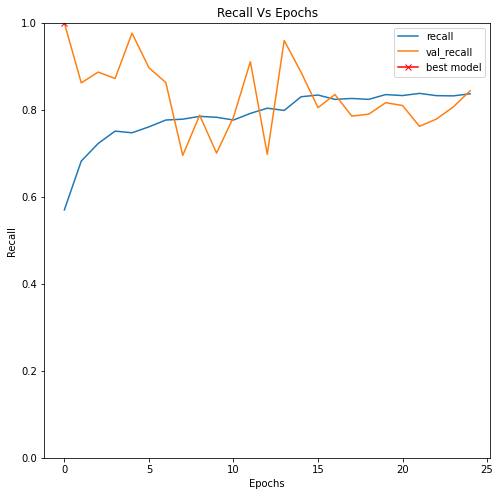

In [ ]:
#Unet Recall
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Recall Vs Epochs")
    plt.plot(results.history["recall"], label="recall")
    plt.plot(results.history["val_recall"], label="val_recall")
    plt.plot(np.argmax(results.history["val_recall"]), np.max(results.history["val_recall"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Recall")
    plt.legend()

plot_history(results)
print(results.history["recall"])

In [ ]:
model.evaluate(X_valid, y_valid, verbose=1)

4/4 [==============================] - 3s 734ms/step - loss: 0.2257 - accuracy: 1.5259e-07 - precision: 0.8941 - recall: 0.8636 - iou: 0.5499 - specificity: 0.9577 - dice_coef: 0.7094


[0.2257218211889267,
 1.5258788721439487e-07,
 0.8941169381141663,
 0.8635612726211548,
 0.5498529672622681,
 0.9577041864395142,
 0.709414005279541]

In [ ]:
np.sum([np.prod(v.get_shape().as_list()) for v in model.trainable_variables])

7533857

In [ ]:
preds_val = model.predict(X_valid, verbose=1)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

4/4 [==============================] - 1s 209ms/step


In [ ]:
def plot_sample_results(X, y, preds, binary_preds, has_mask):
    ix = random.randint(0, len(X))
    print(ix)
    
    fig, ax = plt.subplots(1, 4, figsize=(20,10))
    
    ax[0].imshow(X[ix])
    if has_mask:
        ax[0].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[0].set_title('real mask')
    
    ax[1].imshow(preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[1].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[1].set_title('cancer Predicted')
    
    ax[2].imshow(binary_preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[2].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[2].set_title('cancer Predicted Binary')

    ax[3].imshow(X[ix])
    if has_mask:
        ax[3].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[3].contour(binary_preds[ix].squeeze(), colors='m', levels=[0.5])
    ax[3].set_title('cancer')

58


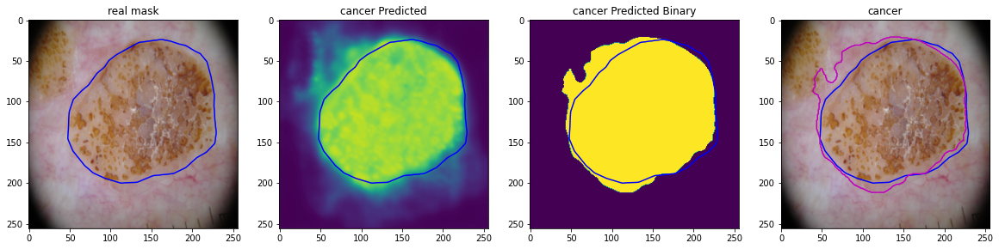

In [ ]:
## Predictions on Test Set 40
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

57


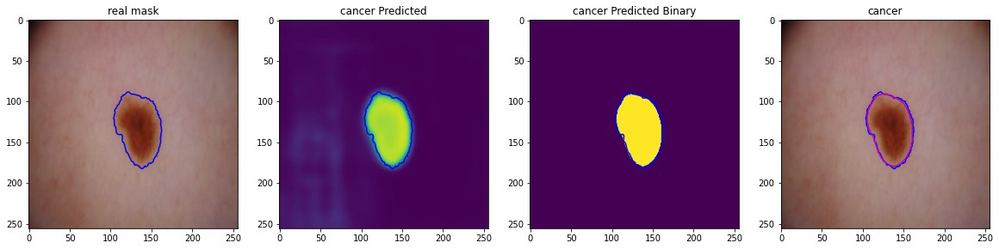

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

15


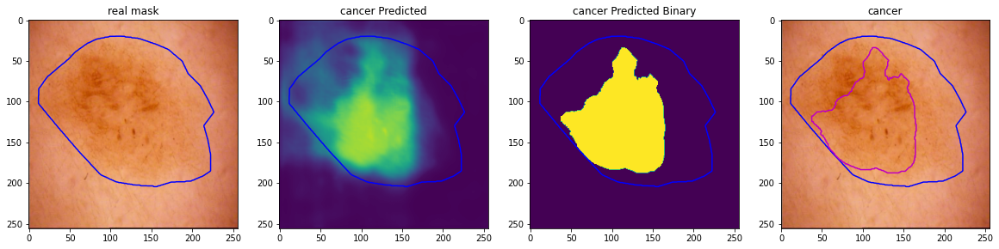

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

44


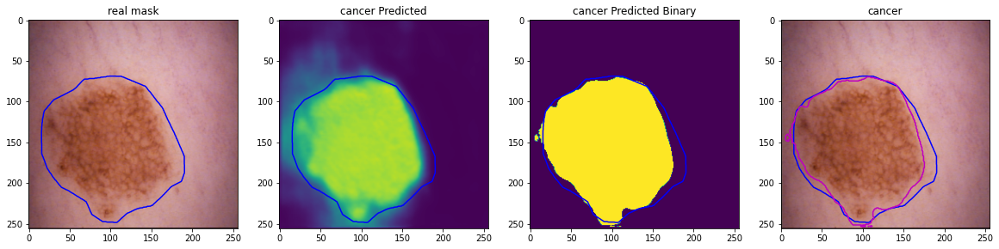

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True) #44

4


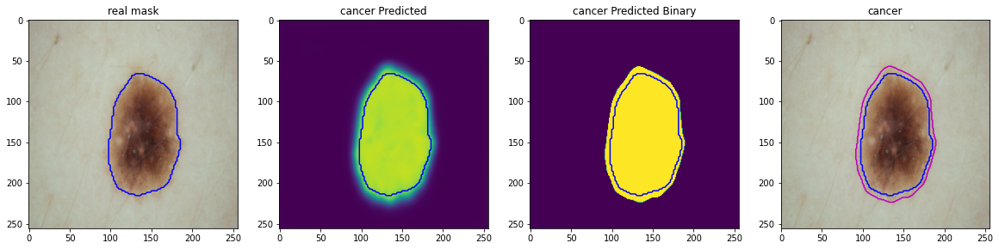

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

50


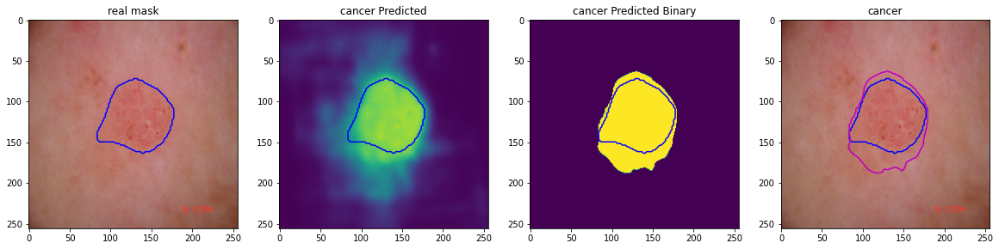

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

95


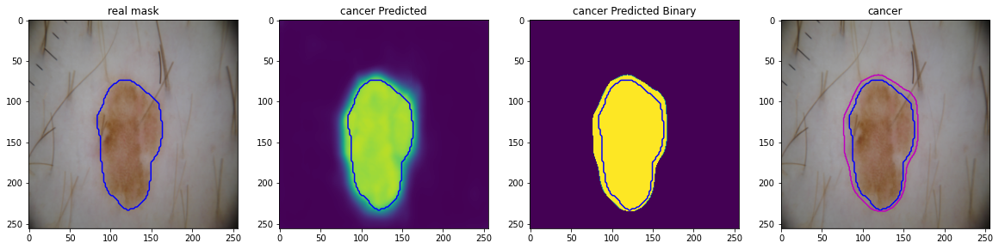

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

8


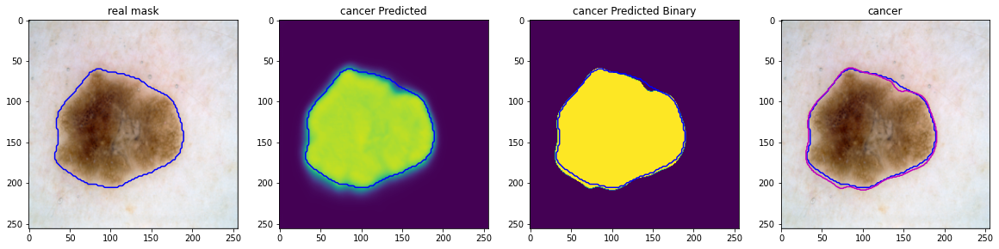

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

33


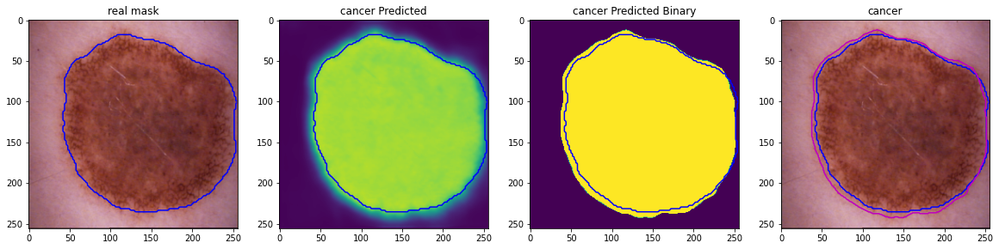

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

79


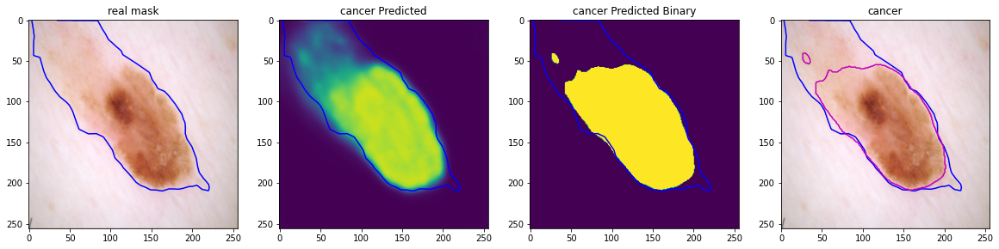

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

## 5.1 Improved U-net 2

[0.29694420099258423, 0.38073620200157166, 0.41177424788475037, 0.43204542994499207, 0.4376989006996155, 0.45890846848487854, 0.44838327169418335, 0.45772087574005127, 0.46976983547210693, 0.4747275710105896, 0.4911021888256073, 0.49183833599090576, 0.5062336325645447, 0.5111172795295715, 0.521643877029419, 0.5299745798110962, 0.5322058200836182, 0.5397858619689941, 0.5441190600395203, 0.5511229038238525, 0.5491649508476257, 0.5581079721450806, 0.5586287379264832, 0.5711859464645386, 0.5782288908958435]


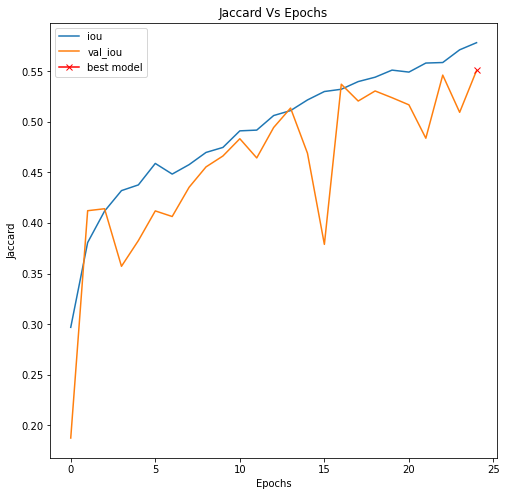

In [ ]:
#Improved Unet Jaccard
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Jaccard Vs Epochs")
    plt.plot(results.history["iou"], label="iou")
    plt.plot(results.history["val_iou"], label="val_iou")
    plt.plot( np.argmax(results.history["val_iou"]), np.max(results.history["val_iou"]), marker="x", color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("Jaccard")
    plt.legend()

    
plot_history(results)
print(results.history["iou"])

[0.5133611559867859, 0.3945821225643158, 0.35871097445487976, 0.33755138516426086, 0.31935837864875793, 0.2971931993961334, 0.29062268137931824, 0.2771604359149933, 0.2612636983394623, 0.25165262818336487, 0.23724889755249023, 0.23116379976272583, 0.21994347870349884, 0.21489845216274261, 0.20707650482654572, 0.20029157400131226, 0.19711190462112427, 0.19139364361763, 0.18871179223060608, 0.18531115353107452, 0.18323545157909393, 0.1799301654100418, 0.1784137785434723, 0.17181088030338287, 0.16820098459720612]


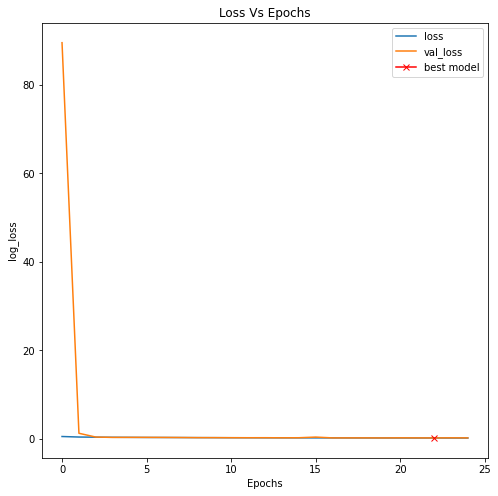

In [ ]:
#Improved Unet Jaccard
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Loss Vs Epochs")
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot(np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("log_loss")
    plt.legend()

plot_history(results)
print(results.history["loss"])

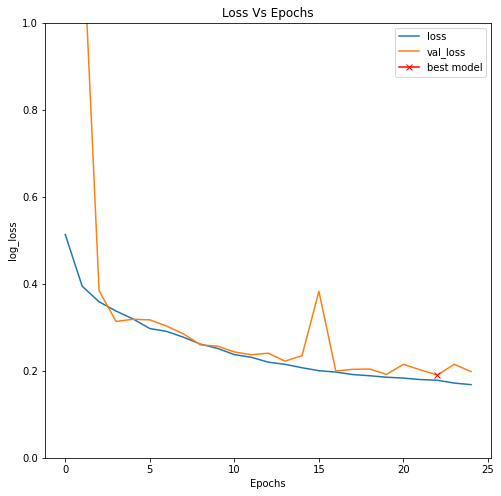

In [ ]:
#Improved Unet Jaccard
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Loss Vs Epochs")
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot(np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("log_loss")
    plt.legend()

plot_history(results)

[0.6791881918907166, 0.8430655002593994, 0.8799739480018616, 0.8774744272232056, 0.8844923377037048, 0.8940709233283997, 0.8867627382278442, 0.8922030329704285, 0.9045289158821106, 0.9005318284034729, 0.910495400428772, 0.9103410840034485, 0.9159559011459351, 0.9145679473876953, 0.923051655292511, 0.9247537851333618, 0.9267632365226746, 0.9322227835655212, 0.9300858974456787, 0.932605504989624, 0.9314892292022705, 0.9337412118911743, 0.9384501576423645, 0.9391382336616516, 0.9428663849830627]


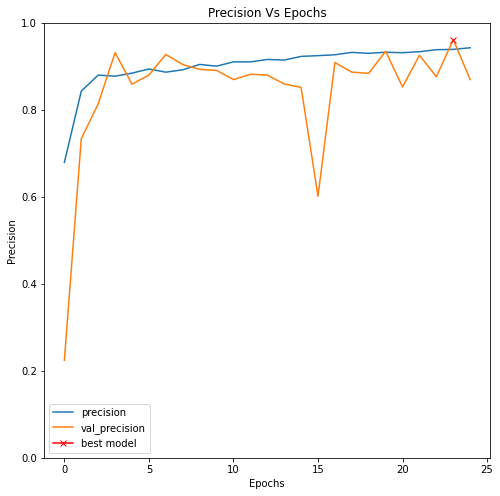

In [ ]:
#Improved Unet Precision
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Precision Vs Epochs")
    plt.plot(results.history["precision"], label="precision")
    plt.plot(results.history["val_precision"], label="val_precision")
    plt.plot(np.argmax(results.history["val_precision"]), np.max(results.history["val_precision"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Precision")
    plt.legend()

plot_history(results)
print(results.history["precision"])

[0.9023516178131104, 0.9549930691719055, 0.9650474190711975, 0.9629204869270325, 0.9643158316612244, 0.9663228988647461, 0.9646453857421875, 0.9662708640098572, 0.9694223999977112, 0.9682739973068237, 0.9706885814666748, 0.9710637927055359, 0.972186267375946, 0.972098171710968, 0.9744197130203247, 0.974672794342041, 0.9755105376243591, 0.9770253300666809, 0.976513683795929, 0.9771976470947266, 0.9770911335945129, 0.9774364829063416, 0.9790793061256409, 0.9789064526557922, 0.9798717498779297]


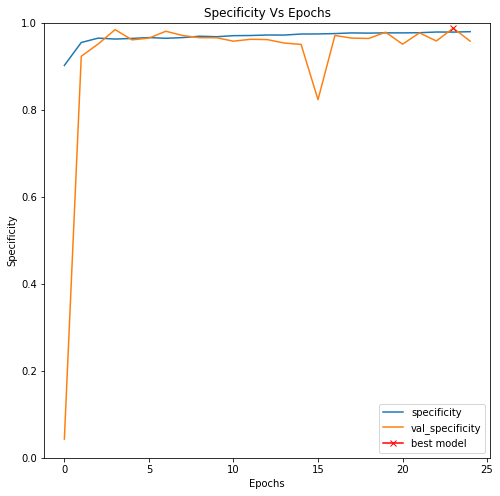

In [ ]:
#Improved Unet Specificity
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Specificity Vs Epochs")
    plt.plot(results.history["specificity"], label="specificity")
    plt.plot(results.history["val_specificity"], label="val_specificity")
    plt.plot(np.argmax(results.history["val_specificity"]), np.max(results.history["val_specificity"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Specificity")
    plt.legend()

plot_history(results)
print(results.history["specificity"])

[0.45543166995048523, 0.5500611662864685, 0.5822790265083313, 0.6021755933761597, 0.6079419851303101, 0.6283758282661438, 0.6181023716926575, 0.6270183324813843, 0.6381978392601013, 0.6430667042732239, 0.6580029129981995, 0.6586388349533081, 0.671470046043396, 0.6754802465438843, 0.6851758360862732, 0.6924125552177429, 0.6940514445304871, 0.7005667686462402, 0.7043775916099548, 0.7101269364356995, 0.708217203617096, 0.7156068682670593, 0.7162425518035889, 0.7266918420791626, 0.7324569821357727]


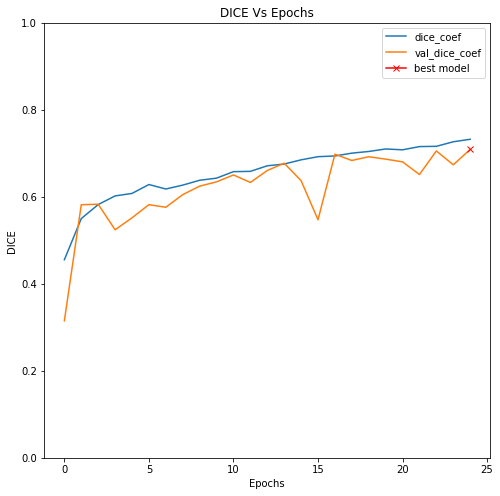

In [ ]:
#Improved Unet DICE
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("DICE Vs Epochs")
    plt.plot(results.history["dice_coef"], label="dice_coef")
    plt.plot(results.history["val_dice_coef"], label="val_dice_coef")
    plt.plot(np.argmax(results.history["val_dice_coef"]), np.max(results.history["val_dice_coef"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("DICE")
    plt.legend()

plot_history(results)
print(results.history["dice_coef"])

[0.6638339757919312, 0.7452680468559265, 0.7615678310394287, 0.7943091988563538, 0.804873526096344, 0.8255477547645569, 0.8171541094779968, 0.8194844722747803, 0.8278641700744629, 0.8295302987098694, 0.8402384519577026, 0.836155354976654, 0.8458061814308167, 0.8427696228027344, 0.8452156186103821, 0.8502152562141418, 0.844024658203125, 0.8452617526054382, 0.8471586108207703, 0.8504288196563721, 0.847419798374176, 0.8531101942062378, 0.8455970883369446, 0.8573979735374451, 0.8605549931526184]


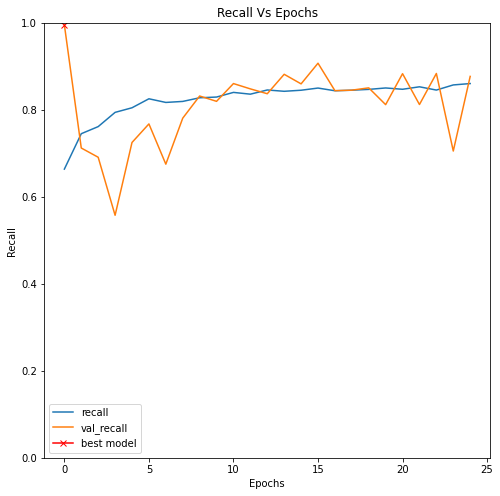

In [ ]:
#Unet Recall
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Recall Vs Epochs")
    plt.plot(results.history["recall"], label="recall")
    plt.plot(results.history["val_recall"], label="val_recall")
    plt.plot(np.argmax(results.history["val_recall"]), np.max(results.history["val_recall"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Recall")
    plt.legend()

plot_history(results)
print(results.history["recall"])

In [ ]:
model.evaluate(X_valid, y_valid, verbose=1)

4/4 [==============================] - 1s 170ms/step - loss: 0.2574 - accuracy: 0.0000e+00 - precision: 0.8370 - recall: 0.9023 - iou: 0.5345 - specificity: 0.9284 - dice_coef: 0.6951


[0.2573639154434204,
 0.0,
 0.8369640707969666,
 0.9022819399833679,
 0.5344703793525696,
 0.9283756017684937,
 0.6951213479042053]

In [ ]:
np.sum([np.prod(v.get_shape().as_list()) for v in model.trainable_variables])

7533857

In [ ]:
preds_val = model.predict(X_valid, verbose=1)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

4/4 [==============================] - 1s 208ms/step


In [ ]:
def plot_sample_results(X, y, preds, binary_preds, has_mask):
    ix = random.randint(0, len(X))
    # ix = 62
    print(ix)
    
    fig, ax = plt.subplots(1, 4, figsize=(20,10))
    
    ax[0].imshow(X[ix])
    if has_mask:
        ax[0].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[0].set_title('real mask')
    
    ax[1].imshow(preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[1].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[1].set_title('cancer Predicted')
    
    ax[2].imshow(binary_preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[2].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[2].set_title('cancer Predicted Binary')

    ax[3].imshow(X[ix])
    if has_mask:
        ax[3].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[3].contour(binary_preds[ix].squeeze(), colors='m', levels=[0.5])
    ax[3].set_title('cancer')

51


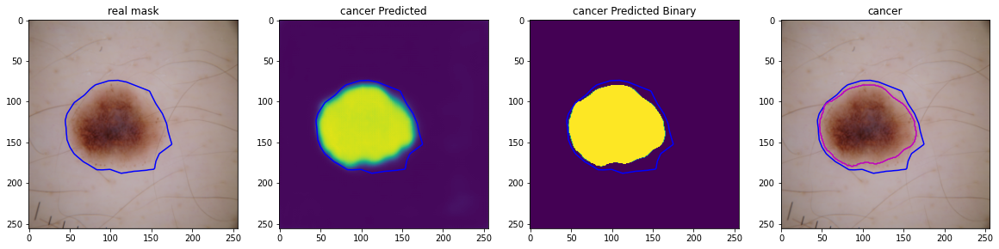

In [ ]:
## Predictions on Test Set 40
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

24


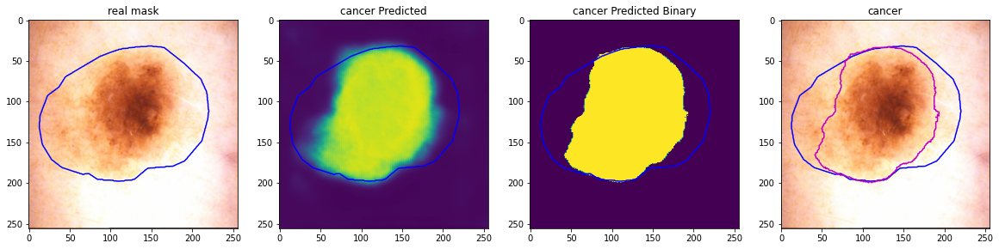

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

45


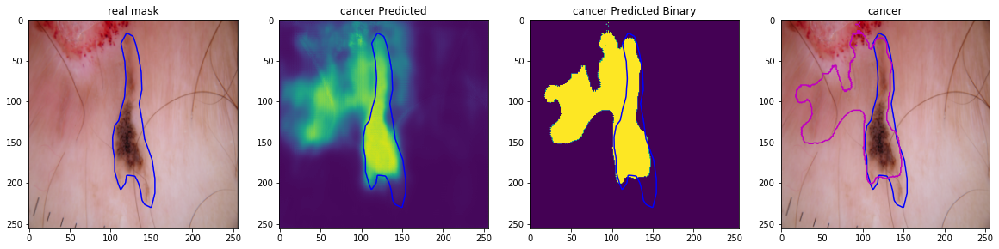

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

91


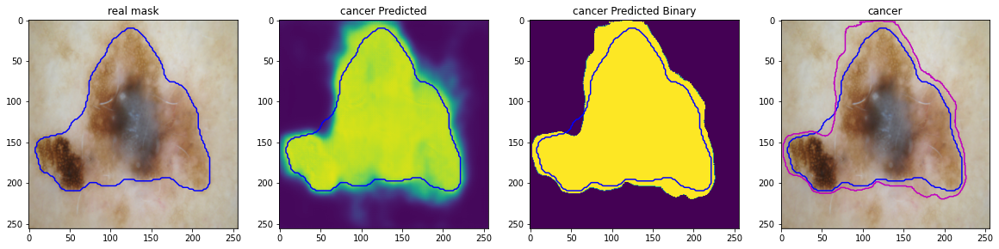

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True) #44

95


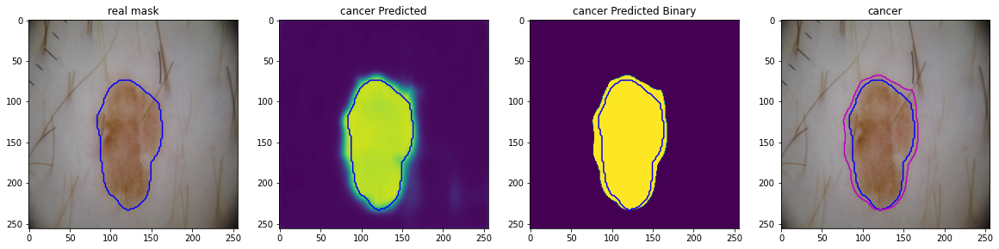

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

59


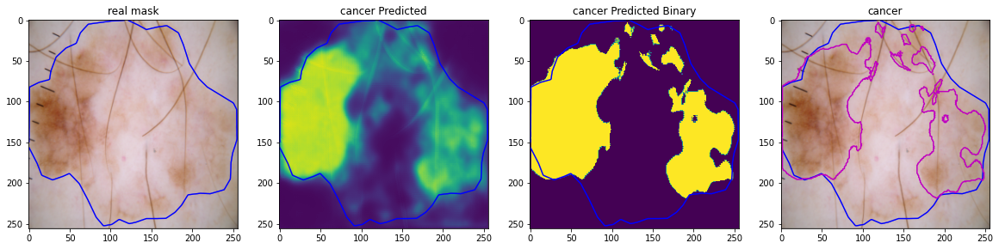

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

41


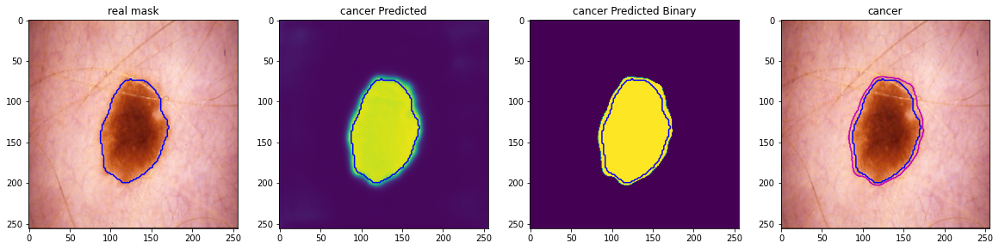

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

25


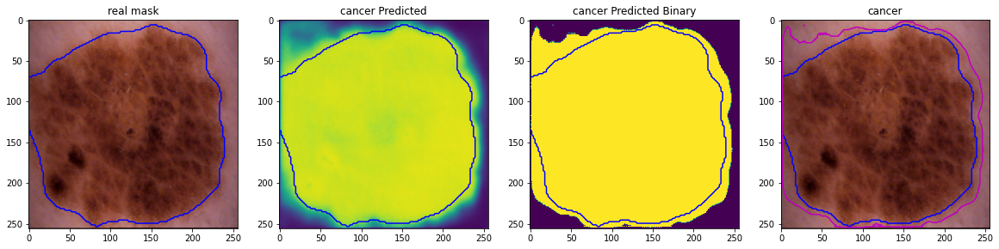

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

49


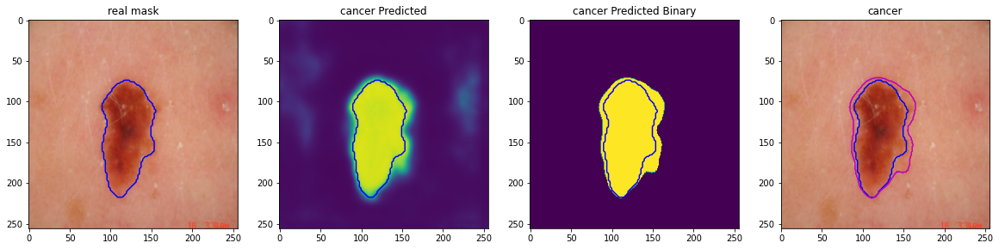

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

45


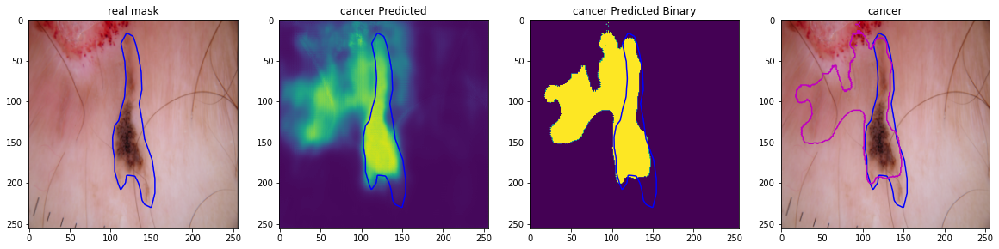

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

48


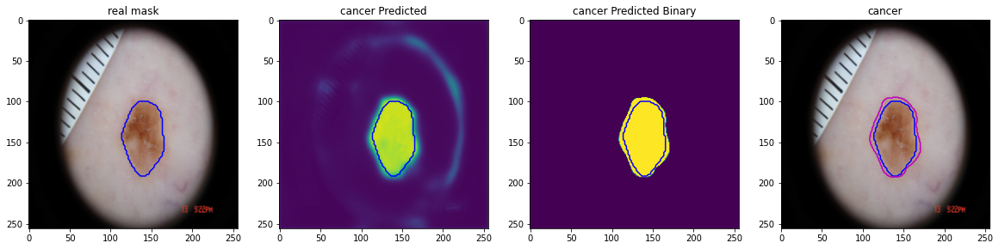

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

## 5.1 Improved U-net 3

[0.2950550317764282, 0.3695325255393982, 0.41187500953674316, 0.4443475604057312, 0.46988222002983093, 0.49557211995124817, 0.504632830619812, 0.5040491819381714, 0.5214859843254089, 0.5252698659896851, 0.5235962271690369, 0.5337455868721008, 0.5433434247970581, 0.5399295091629028, 0.551724374294281, 0.547568678855896, 0.5552436113357544, 0.5580959916114807, 0.5672950744628906, 0.5772214531898499, 0.587323009967804, 0.5893309712409973, 0.5919179320335388, 0.5900725722312927, 0.5937684178352356]


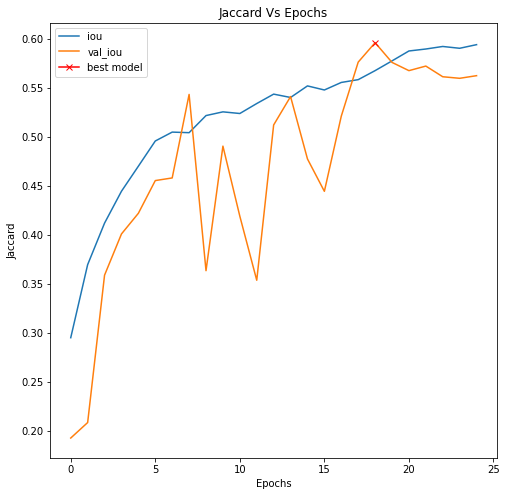

In [ ]:
#Improved Unet Jaccard
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Jaccard Vs Epochs")
    plt.plot(results.history["iou"], label="iou")
    plt.plot(results.history["val_iou"], label="val_iou")
    plt.plot( np.argmax(results.history["val_iou"]), np.max(results.history["val_iou"]), marker="x", color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("Jaccard")
    plt.legend()

    
plot_history(results)
print(results.history["iou"])

[0.4989977180957794, 0.37194737792015076, 0.29303064942359924, 0.248638316988945, 0.2270137369632721, 0.2112017422914505, 0.20589439570903778, 0.20707139372825623, 0.19656018912792206, 0.19580134749412537, 0.19307921826839447, 0.190223827958107, 0.1856469213962555, 0.1868199110031128, 0.18092277646064758, 0.18161217868328094, 0.17667317390441895, 0.1786913126707077, 0.17028214037418365, 0.1642078012228012, 0.16023439168930054, 0.1584056317806244, 0.15824703872203827, 0.15769045054912567, 0.1571793556213379]


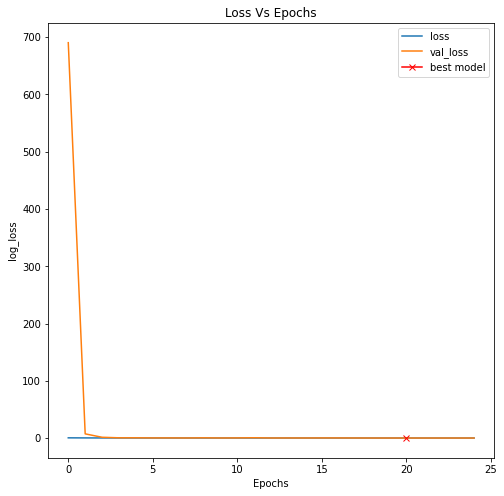

In [ ]:
#Improved Unet Jaccard
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Loss Vs Epochs")
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot(np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
    plt.xlabel("Epochs")
    plt.ylabel("log_loss")
    plt.legend()

plot_history(results)
print(results.history["loss"])

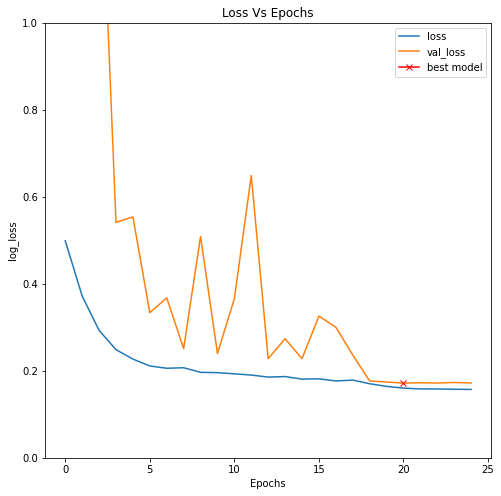

In [ ]:
#Improved Unet Jaccard
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Loss Vs Epochs")
    plt.plot(results.history["loss"], label="loss")
    plt.plot(results.history["val_loss"], label="val_loss")
    plt.plot(np.argmin(results.history["val_loss"]), np.min(results.history["val_loss"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("log_loss")
    plt.legend()

plot_history(results)

[0.6386102437973022, 0.8358057737350464, 0.8732497096061707, 0.8800994753837585, 0.8974431753158569, 0.908691942691803, 0.9118924140930176, 0.9120134115219116, 0.9215942621231079, 0.9214997291564941, 0.9163168668746948, 0.9233545660972595, 0.9278225302696228, 0.9241053462028503, 0.9318413138389587, 0.9307262897491455, 0.9314458966255188, 0.931103527545929, 0.9388331770896912, 0.9432950615882874, 0.9466386437416077, 0.9445791840553284, 0.9460288882255554, 0.9440688490867615, 0.9460520148277283]


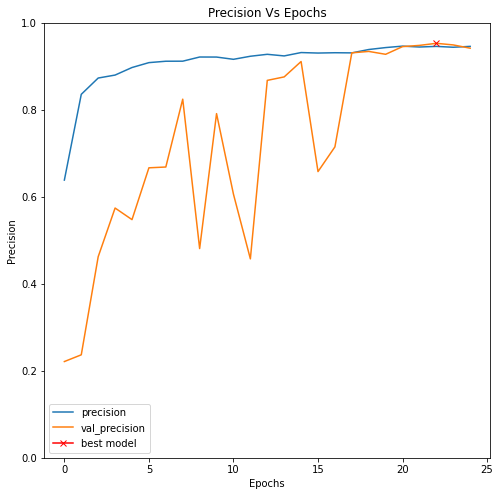

In [ ]:
#Improved Unet Precision
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Precision Vs Epochs")
    plt.plot(results.history["precision"], label="precision")
    plt.plot(results.history["val_precision"], label="val_precision")
    plt.plot(np.argmax(results.history["val_precision"]), np.max(results.history["val_precision"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Precision")
    plt.legend()

plot_history(results)
print(results.history["precision"])

[0.8871141672134399, 0.9559574127197266, 0.9645941257476807, 0.9667285084724426, 0.9711675643920898, 0.9736455678939819, 0.9742681384086609, 0.9750935435295105, 0.9766858220100403, 0.9766231179237366, 0.9750680327415466, 0.9769717454910278, 0.9778175354003906, 0.9768240451812744, 0.9786134958267212, 0.9784872531890869, 0.978441059589386, 0.9780458211898804, 0.980000913143158, 0.9810646176338196, 0.9816715717315674, 0.9810128808021545, 0.9813517928123474, 0.9808986783027649, 0.9813356995582581]


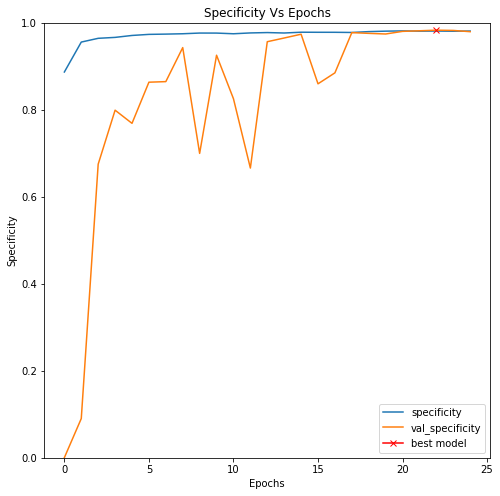

In [ ]:
#Improved Unet Specificity
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Specificity Vs Epochs")
    plt.plot(results.history["specificity"], label="specificity")
    plt.plot(results.history["val_specificity"], label="val_specificity")
    plt.plot(np.argmax(results.history["val_specificity"]), np.max(results.history["val_specificity"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Specificity")
    plt.legend()

plot_history(results)
print(results.history["specificity"])

[0.4528725743293762, 0.5379994511604309, 0.5823606252670288, 0.6139652729034424, 0.6386911273002625, 0.6623525619506836, 0.6704471707344055, 0.6695885062217712, 0.6849557757377625, 0.6882590651512146, 0.6865853667259216, 0.6952532529830933, 0.7036712765693665, 0.7005940675735474, 0.7105972170829773, 0.7071004509925842, 0.7134021520614624, 0.7157167792320251, 0.7234742045402527, 0.731575608253479, 0.7395457029342651, 0.7413450479507446, 0.7433379888534546, 0.7418335676193237, 0.7447351217269897]


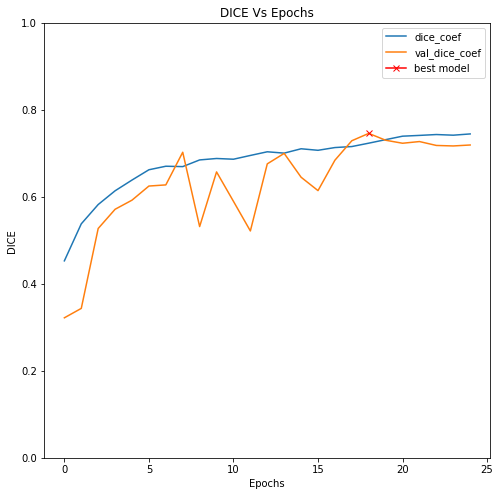

In [ ]:
#Improved Unet DICE
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("DICE Vs Epochs")
    plt.plot(results.history["dice_coef"], label="dice_coef")
    plt.plot(results.history["val_dice_coef"], label="val_dice_coef")
    plt.plot(np.argmax(results.history["val_dice_coef"]), np.max(results.history["val_dice_coef"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("DICE")
    plt.legend()

plot_history(results)
print(results.history["dice_coef"])

[0.6735431551933289, 0.6997314691543579, 0.7400892376899719, 0.7435057163238525, 0.744533360004425, 0.7606690526008606, 0.7652309536933899, 0.7533773183822632, 0.7764753699302673, 0.7750706076622009, 0.7824834585189819, 0.7861403822898865, 0.7933394312858582, 0.7933943867683411, 0.8008918166160583, 0.8002479672431946, 0.8082284927368164, 0.8091830611228943, 0.8217347264289856, 0.8269692063331604, 0.8353284001350403, 0.8410261869430542, 0.8408522009849548, 0.8413028717041016, 0.8422300815582275]


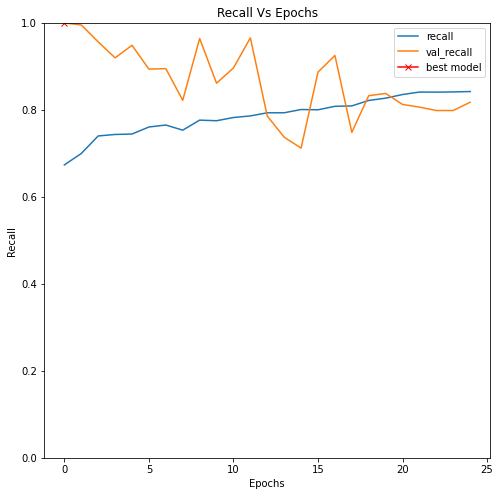

In [ ]:
#Unet Recall
def plot_history(results):
    plt.figure(figsize=(8,8))
    plt.title("Recall Vs Epochs")
    plt.plot(results.history["recall"], label="recall")
    plt.plot(results.history["val_recall"], label="val_recall")
    plt.plot(np.argmax(results.history["val_recall"]), np.max(results.history["val_recall"]), marker="x", color="r", label="best model")
    plt.ylim([0, 1])
    plt.xlabel("Epochs")
    plt.ylabel("Recall")
    plt.legend()

plot_history(results)
print(results.history["recall"])

In [ ]:
model.evaluate(X_valid, y_valid, verbose=1)

4/4 [==============================] - 1s 170ms/step - loss: 0.2169 - accuracy: 0.0000e+00 - precision: 0.9187 - recall: 0.8365 - iou: 0.5543 - specificity: 0.9675 - dice_coef: 0.7129


[0.2169165015220642,
 0.0,
 0.9186784625053406,
 0.8364964723587036,
 0.5542954206466675,
 0.9675477147102356,
 0.7129154801368713]

In [ ]:
np.sum([np.prod(v.get_shape().as_list()) for v in model.trainable_variables])

7533857

In [ ]:
preds_val = model.predict(X_valid, verbose=1)
preds_val_t = (preds_val > 0.5).astype(np.uint8)

4/4 [==============================] - 1s 207ms/step


In [ ]:
def plot_sample_results(X, y, preds, binary_preds, has_mask):
    ix = random.randint(0, len(X))
    # ix = 62
    print(ix)
    
    fig, ax = plt.subplots(1, 4, figsize=(20,10))
    
    ax[0].imshow(X[ix])
    if has_mask:
        ax[0].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[0].set_title('real mask')
    
    ax[1].imshow(preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[1].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[1].set_title('cancer Predicted')
    
    ax[2].imshow(binary_preds[ix].squeeze(), vmin=0, vmax=1)
    if has_mask:
        ax[2].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[2].set_title('cancer Predicted Binary')

    ax[3].imshow(X[ix])
    if has_mask:
        ax[3].contour(y[ix].squeeze(), colors='b', levels=[0.5])
    ax[3].contour(binary_preds[ix].squeeze(), colors='m', levels=[0.5])
    ax[3].set_title('cancer')

45


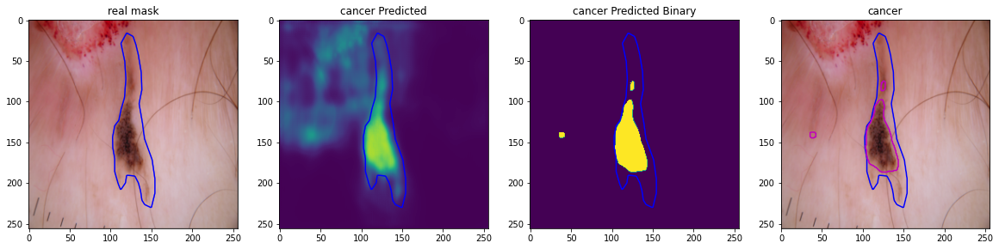

In [ ]:
## Predictions on Test Set 40
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

53


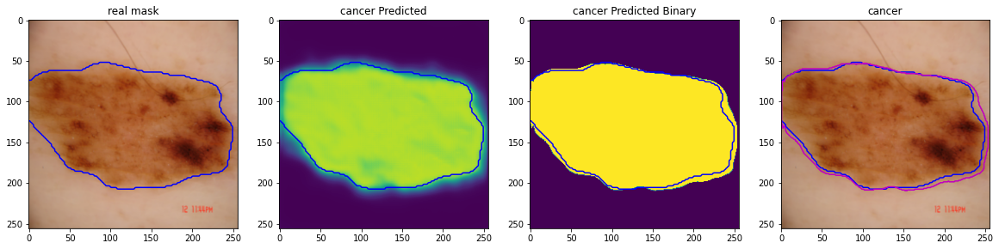

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

55


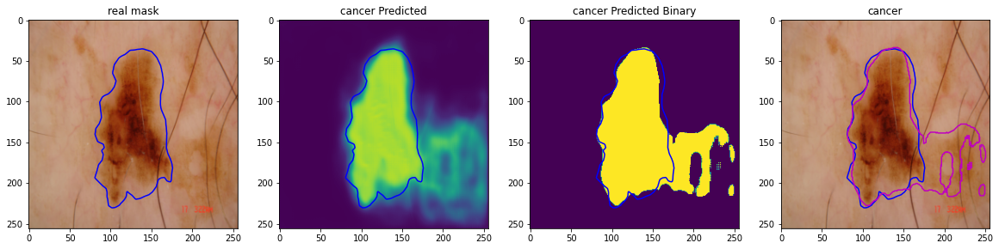

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

83


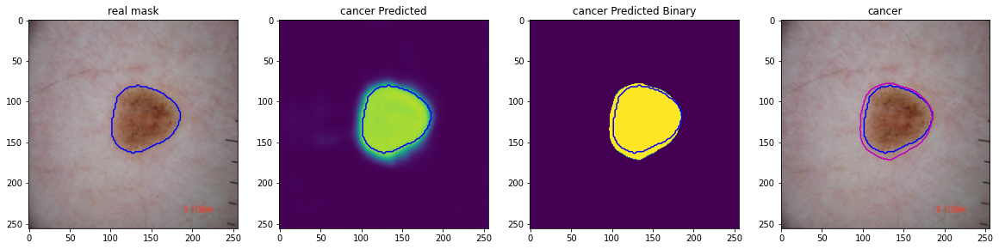

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True) #44

68


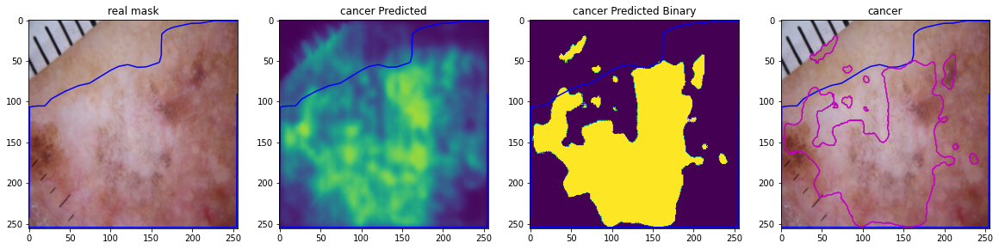

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

84


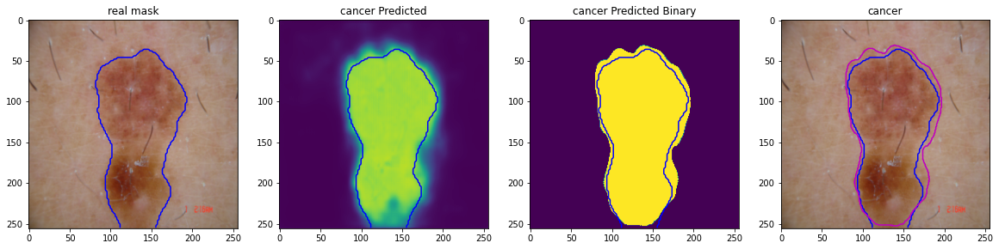

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

82


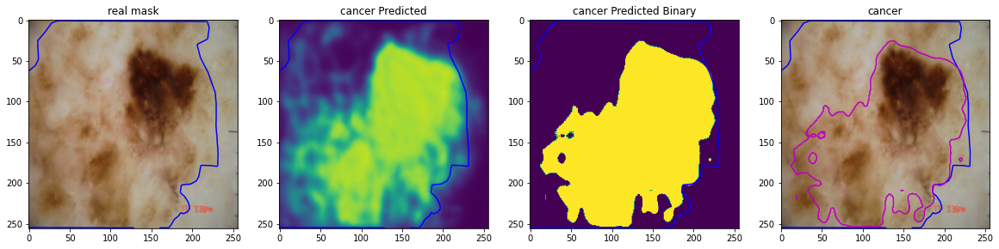

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

77


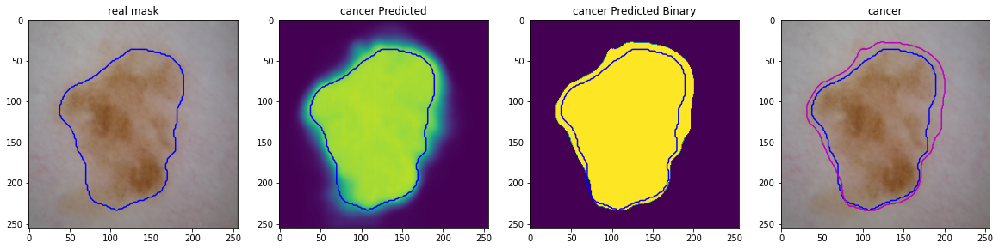

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

81


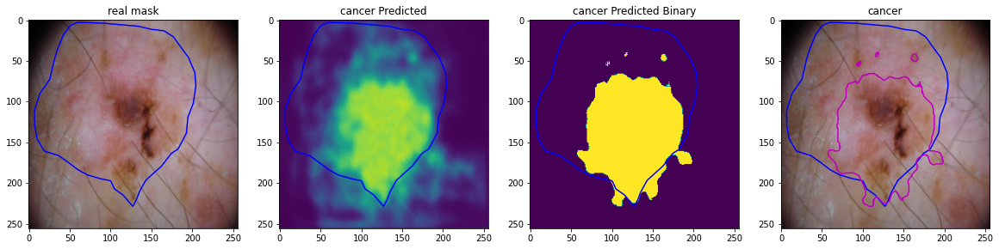

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

58


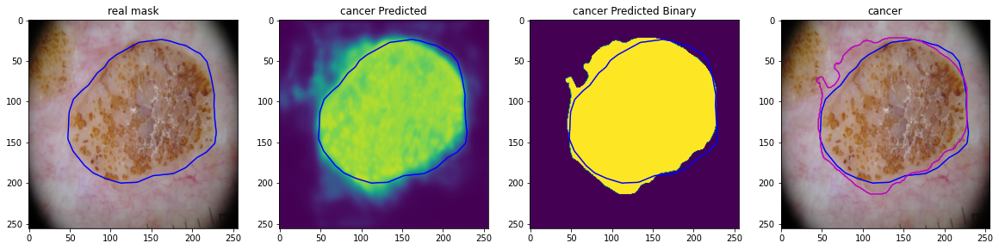

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)

52


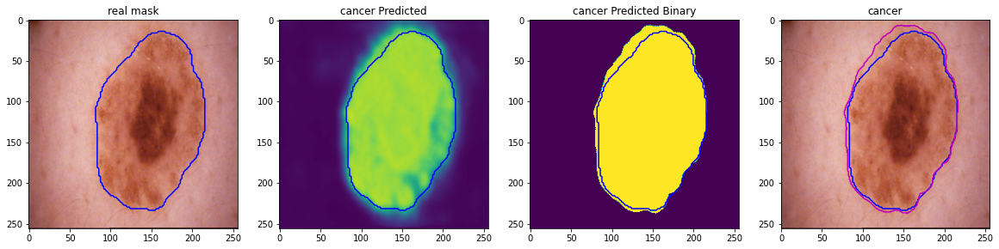

In [ ]:
plot_sample_results(X=X_valid, y=y_valid, preds=preds_val, binary_preds=preds_val_t, has_mask=True)